In [1]:
from matplotlib import pyplot as plt
import numpy as np
from time import time
from os.path import abspath, join
import sys
from glob import glob
from tqdm import tqdm
from hammer import vel
root_dir = abspath(join('..', '..'))
root_data_dir = join(root_dir, 'Data')
sys.path.append(root_dir)

In [2]:
from utils import (plot_corner, plot_chain, plot_fit_w, style, get_params,
                   get_initial_position_normal, get_data, generate_init)
style()

In [3]:
w_dir_path = join(root_data_dir, 'MCMC-no', 'mock', 'data', 'z')
z_dir_path = join(root_data_dir, 'MCMC-no', 'mock', 'data', 'z')
w_dir_path, z_dir_path

('/home2/s20321005/Thesis-Project/Data/MCMC-no/mock/data/z',
 '/home2/s20321005/Thesis-Project/Data/MCMC-no/mock/data/z')

In [44]:
ind = 0
wdata = get_data(w_dir_path, ind, tipe="w")
files = glob(join(w_dir_path, "w*"))
files.sort()
name = files[ind].split(
    "/")[-1].split(".")[0].replace("w", "psi") + ".npy"
name

'psi_162.npy'

# Fit w

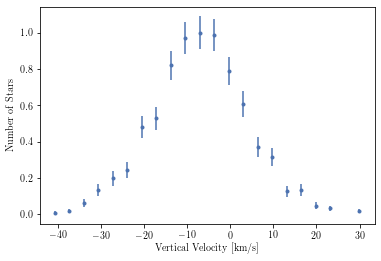

In [5]:
wmid, wnum, werr = wdata

plt.errorbar(wmid, wnum, yerr=werr, fmt='.')
plt.xlabel("Vertical Velocity [km/s]")
plt.ylabel("Number of Stars")
plt.show()

In [6]:
psi, locs, scales, labels, labs = generate_init("kin")
[(lb, l, l+s) for lb,  l, s in zip(labels, locs, scales)]

[('$w_0$', -15.0, 0.0),
 ('$\\log \\sigma_{w,1}$', 0.0, 3.4011973816621555),
 ('$\\log \\sigma_{w,2}$', 0.0, 3.4011973816621555),
 ('$\\log a_1$', 0.0, 2.0),
 ('$\\log a_2$', 0.0, 2.0),
 ('$\\log \\Phi$', 0.0, 10.0)]

In [12]:
ndim = len(labs)
nwalker = 10*ndim
p0 = None
while True:
  p0 = vel.generate_p0(nwalker, locs, scales)
  indexes = list(range(ndim))
  prob0 = vel.log_prob_par(p0, wdata, locs, scales)
  mask = np.isinf(prob0[:, 0])
  p0 = p0[~mask]
  if p0.shape[0] % 2 != 0:
    p0 = np.append(p0, p0[0][None, :], axis=0)
  p0.shape
  if len(p0) > 2*ndim:
    break
p0.shape

(20, 6)

In [13]:
vel.log_prob_par(p0, wdata, locs, scales)

array([[-1.12924206e+01, -4.61363600e+03, -4.62492842e+03],
       [-1.11224013e+01, -3.71571361e+03, -3.72683602e+03],
       [-1.08627897e+01, -1.37344095e+03, -1.38430374e+03],
       [-1.11798119e+01, -8.11331930e+02, -8.22511742e+02],
       [-1.13708979e+01, -1.03670315e+04, -1.03784024e+04],
       [-1.07650864e+01, -5.49588313e+03, -5.50664822e+03],
       [-1.08699172e+01, -1.15763594e+03, -1.16850586e+03],
       [-1.11535374e+01, -4.14272408e+03, -4.15387762e+03],
       [-1.11635718e+01, -5.60028015e+04, -5.60139651e+04],
       [-1.10793986e+01, -1.26367174e+04, -1.26477968e+04],
       [-1.14368313e+01, -4.33276858e+03, -4.34420541e+03],
       [-1.09335232e+01, -1.20404688e+03, -1.21498041e+03],
       [-1.08022425e+01, -3.27299650e+03, -3.28379874e+03],
       [-1.09813522e+01, -8.98698921e+02, -9.09680273e+02],
       [-1.07579470e+01, -7.83579934e+03, -7.84655729e+03],
       [-1.07768642e+01, -2.13935786e+03, -2.15013472e+03],
       [-1.08936588e+01, -2.59220177e+03

In [14]:
indexes = list(range(ndim))

for _ in tqdm(range(5)):
    chain = vel.mcmc(5000, p0, wdata, locs, scales, parallel=True, verbose=True)
    locs_normal, scales_normal = get_initial_position_normal("kin", 
                                                              chain=chain[1000:], 
                                                              indexes=indexes)
    while True:
      p0 = vel.generate_p0(nwalker, locs, scales)
      indexes = list(range(ndim))
      prob0 = vel.log_prob_par(p0, wdata, locs, scales)
      mask = np.isinf(prob0[:, 0])
      p0 = p0[~mask]
      if p0.shape[0] % 2 != 0:
        p0 = np.append(p0, p0[0][None, :], axis=0)
      p0.shape
      if len(p0) > 2*ndim:
        break
    chain = vel.mcmc(5000, p0, wdata, locs, scales, parallel=True, verbose=True)
    p0 = chain[-1]

100%|██████████| 5/5 [00:03<00:00,  1.42it/s]


In [39]:
chain = vel.mcmc(100_000, p0, wdata, locs, scales, parallel=True, verbose=True)
chain_thin = chain[::100]
chain_thin.shape

(1000, 18, 6)

6it [00:00, 142.73it/s]


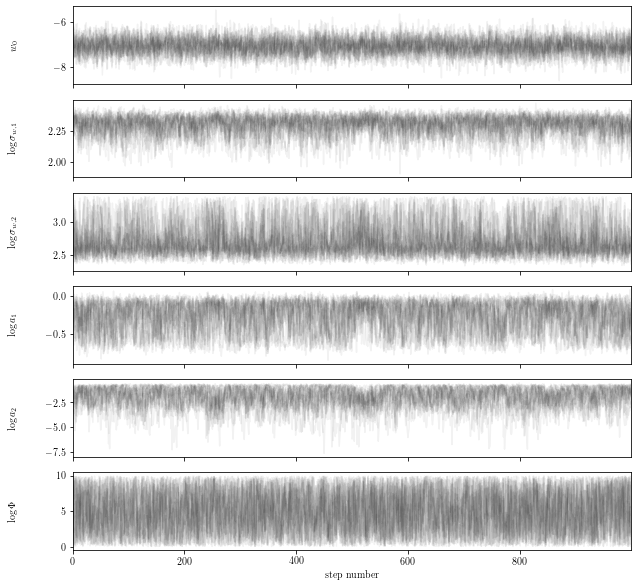

In [40]:
params = get_params(chain_thin, indexes, labs)

plot_chain().params(params).labels(labels).alpha(0.05).run()

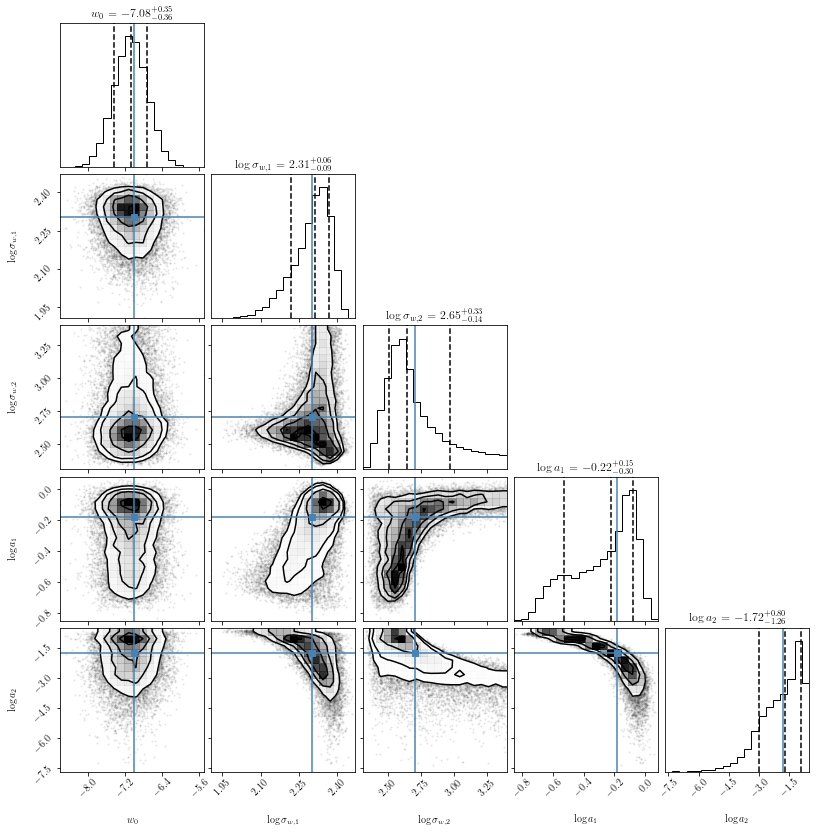

In [41]:


params = get_params(chain_thin, indexes, labs)

plot_corner().params(params[:,:, :-1]).labels(labels[:-1]).truths(psi).run()

  0%|          | 0/5000 [00:00<?, ?it/s]

100%|██████████| 5000/5000 [00:00<00:00, 33782.86it/s]


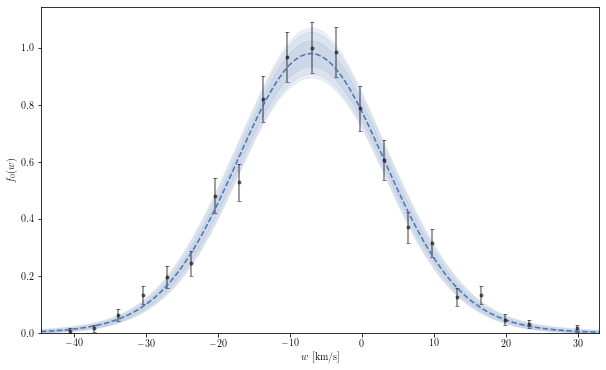

In [42]:
flat_samples = chain_thin.reshape(-1, ndim)

plot_fit_w().index(ind).w_dir_path(w_dir_path).flat(flat_samples).run()

In [45]:
np.save(join(w_dir_path,'PSI', name), flat_samples)
# print flat_samples memory size
print(flat_samples.nbytes/1e6, "MB")

0.864 MB


# Automate

In [1]:
from matplotlib import pyplot as plt
import numpy as np
from time import time
from os.path import abspath, join
import sys
from glob import glob
from tqdm import tqdm
from hammer import vel
root_dir = abspath(join('..', '..'))
root_data_dir = join(root_dir, 'Data')
sys.path.append(root_dir)

In [2]:
from utils import (plot_corner, plot_chain, plot_fit_w, style, get_params,
                   get_initial_position_normal, get_data, generate_init)
style()

In [3]:
# OG
w0 = -7.
sigma1 = 10.
sigma2 = 15.
log_sigmaw1 = np.log(sigma1)
log_sigmaw2 = np.log(sigma2)

a1 = 1.
a2 = 0.2
atot = a1+a2
a1 /= atot
a2 /= atot
log_a1 = np.log(a1)
log_a2 = np.log(a2)
psi = np.array([w0, log_sigmaw1, log_sigmaw2, log_a1, log_a2])

## $z$

In [7]:
w_dir_path = join(root_data_dir, 'MCMC-no', 'mock', 'data', 'z')
z_dir_path = join(root_data_dir, 'MCMC-no', 'mock', 'data', 'z')
w_dir_path, z_dir_path

('/home2/s20321005/Thesis-Project/Data/MCMC-no/mock/data/z',
 '/home2/s20321005/Thesis-Project/Data/MCMC-no/mock/data/z')

Starting  psi_162.npy


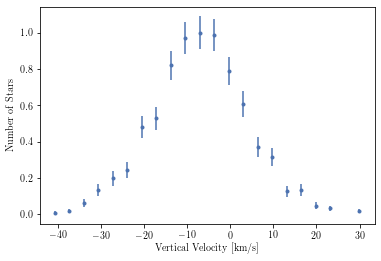

100%|██████████| 5/5 [00:04<00:00,  1.04it/s]


psi_162.npy


6it [00:00, 50.48it/s]


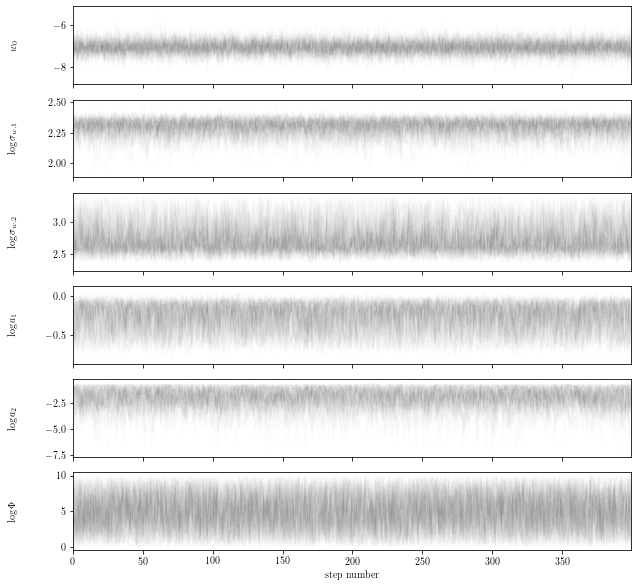

psi_162.npy


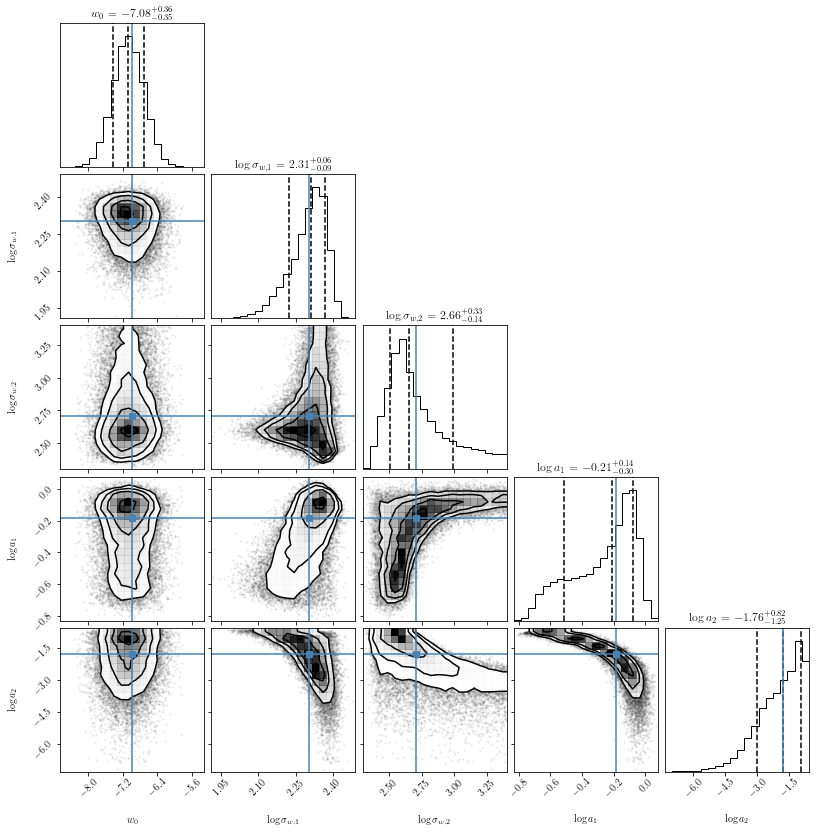

psi_162.npy


100%|██████████| 5000/5000 [00:00<00:00, 34228.04it/s]


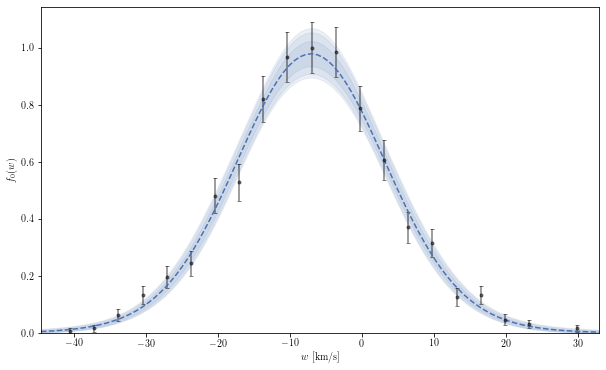

1.152 MB
(24000, 6)
Done with  psi_162.npy
Starting  psi_208.npy


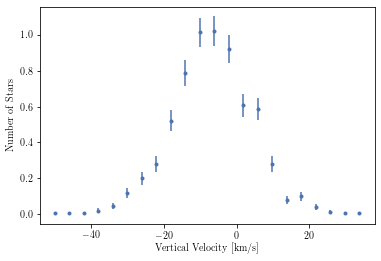

100%|██████████| 5/5 [00:04<00:00,  1.13it/s]


psi_208.npy


6it [00:00, 48.63it/s]


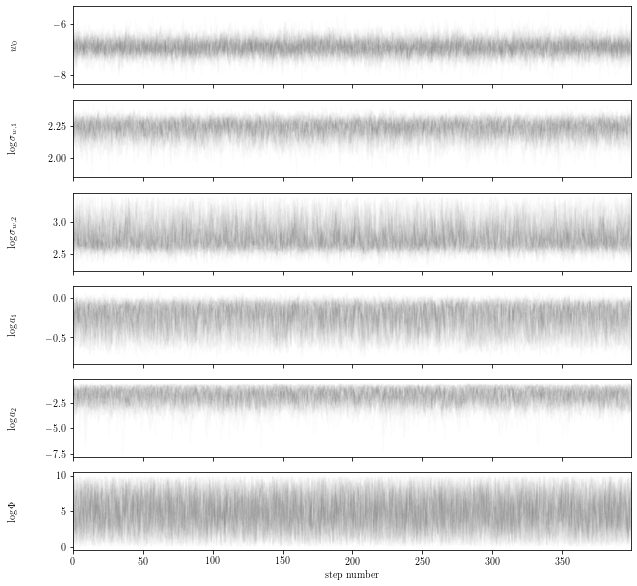

psi_208.npy


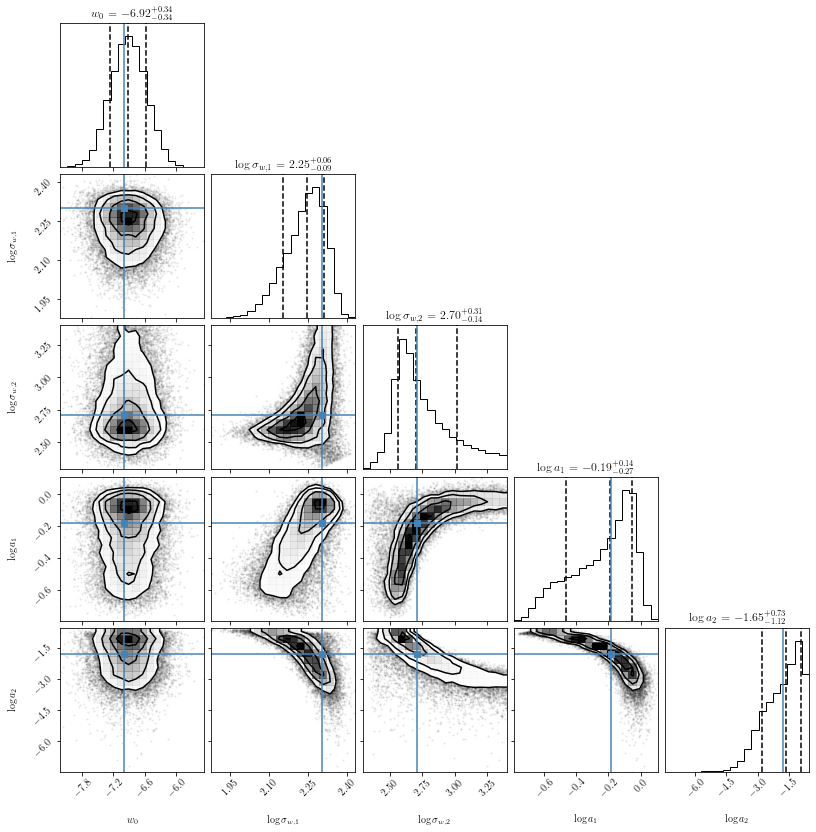

psi_208.npy


100%|██████████| 5000/5000 [00:00<00:00, 42596.90it/s]


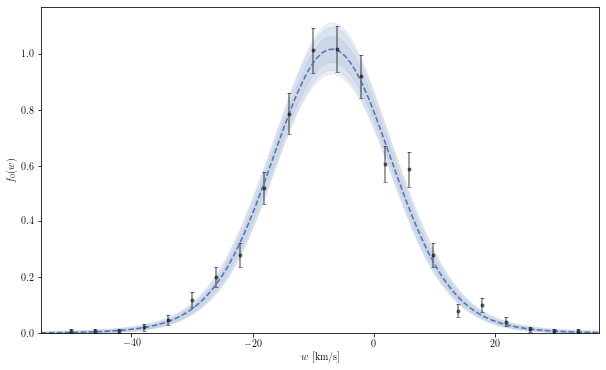

1.152 MB
(24000, 6)
Done with  psi_208.npy
Starting  psi_282.npy


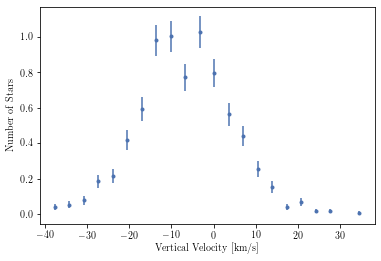

100%|██████████| 5/5 [00:04<00:00,  1.18it/s]


psi_282.npy


6it [00:00, 47.32it/s]


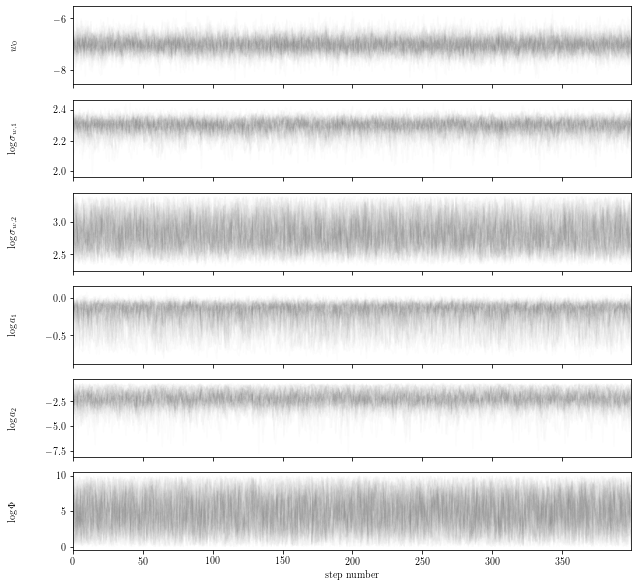

psi_282.npy


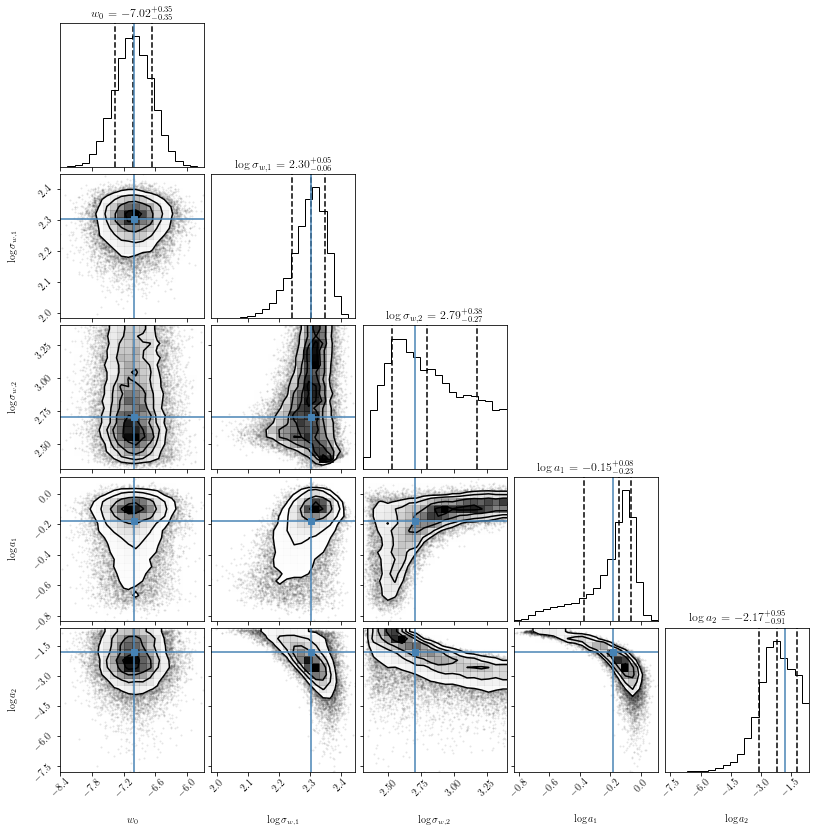

psi_282.npy


100%|██████████| 5000/5000 [00:00<00:00, 39418.89it/s]


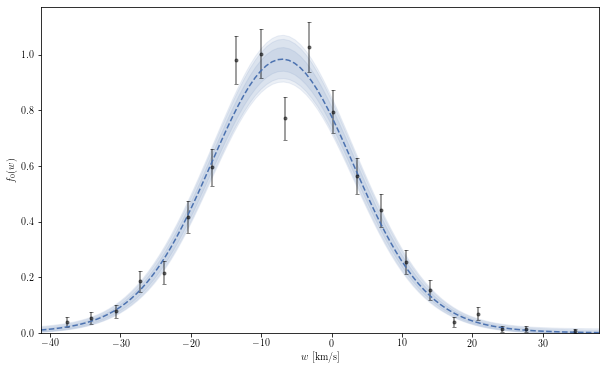

1.152 MB
(24000, 6)
Done with  psi_282.npy
Starting  psi_356.npy


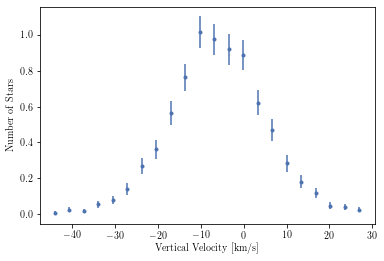

100%|██████████| 5/5 [00:04<00:00,  1.17it/s]


psi_356.npy


6it [00:00, 46.44it/s]


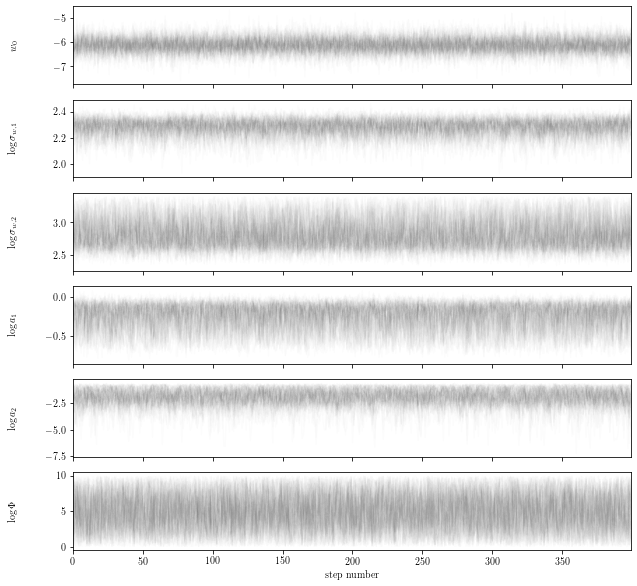

psi_356.npy


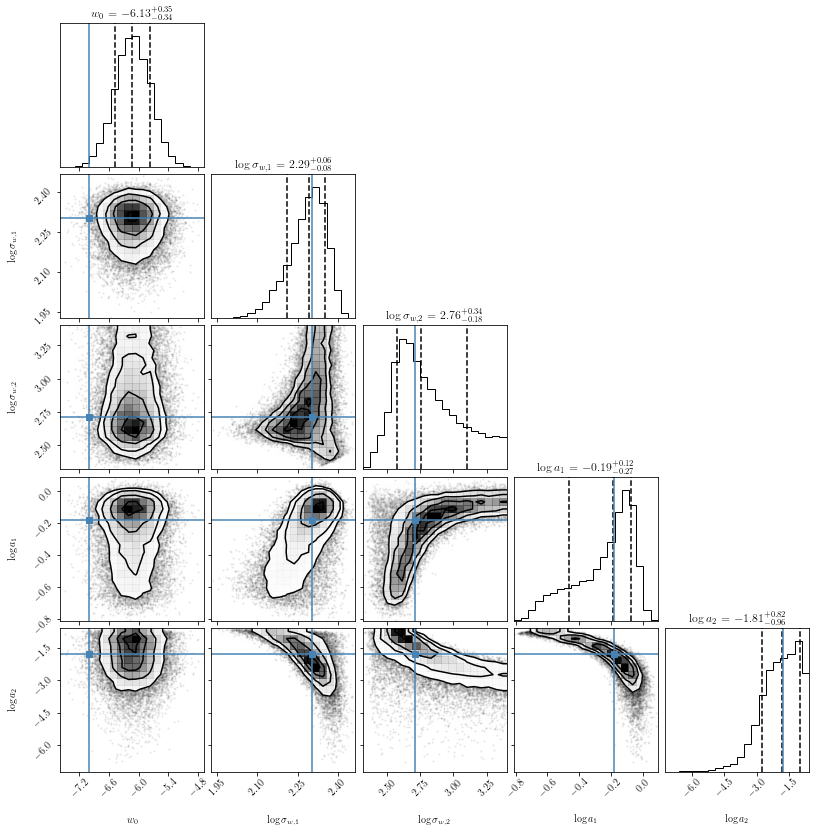

psi_356.npy


100%|██████████| 5000/5000 [00:00<00:00, 36738.13it/s]


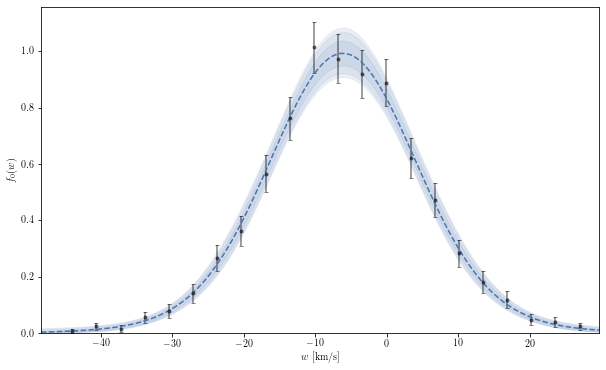

1.152 MB
(24000, 6)
Done with  psi_356.npy
Starting  psi_526.npy


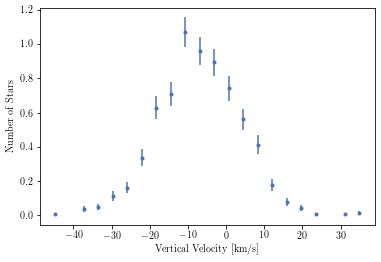

100%|██████████| 5/5 [00:04<00:00,  1.18it/s]


psi_526.npy


6it [00:00, 50.93it/s]


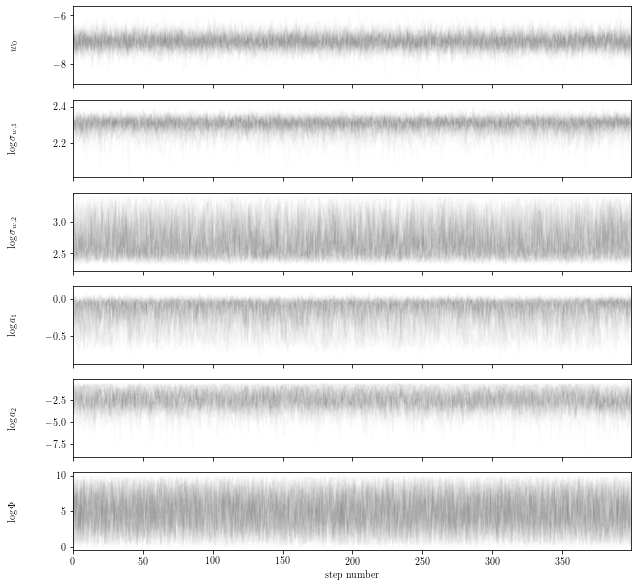

psi_526.npy


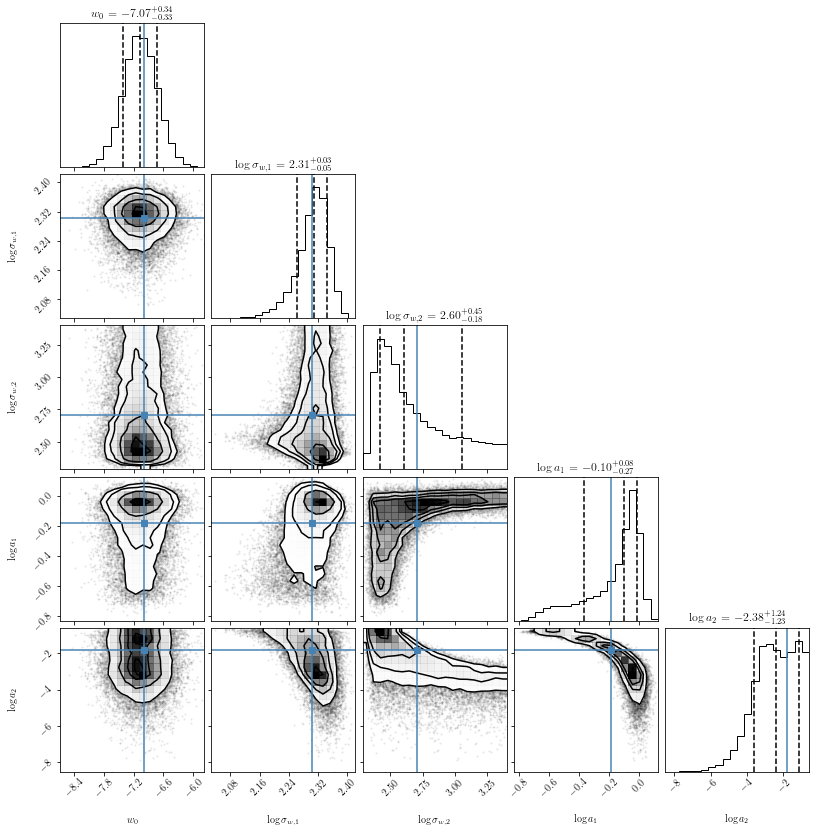

psi_526.npy


100%|██████████| 5000/5000 [00:00<00:00, 40920.12it/s]


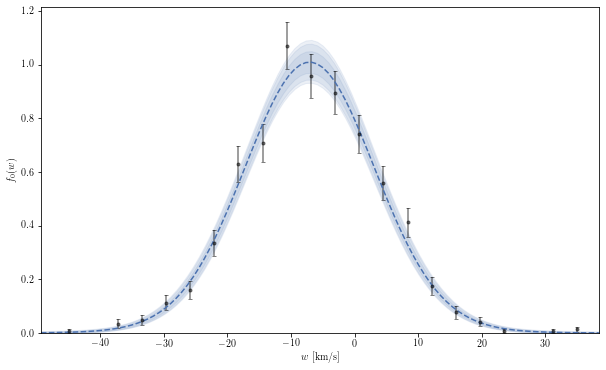

1.152 MB
(24000, 6)
Done with  psi_526.npy
Starting  psi_721.npy


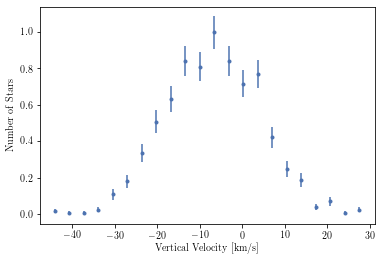

100%|██████████| 5/5 [00:04<00:00,  1.09it/s]


psi_721.npy


6it [00:00, 48.73it/s]


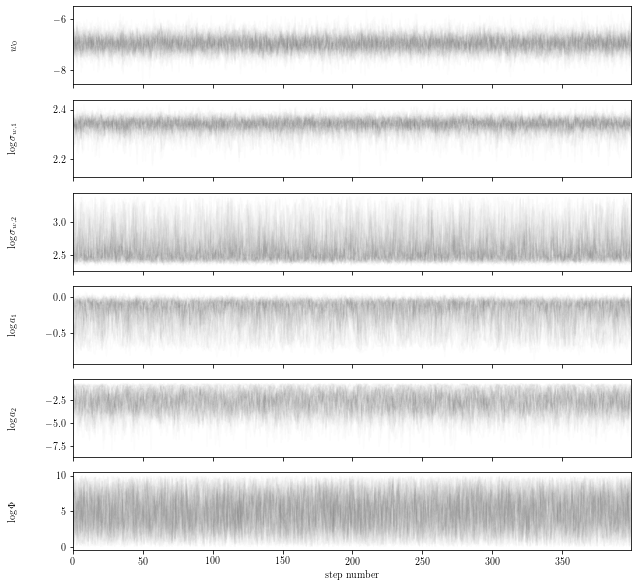

psi_721.npy


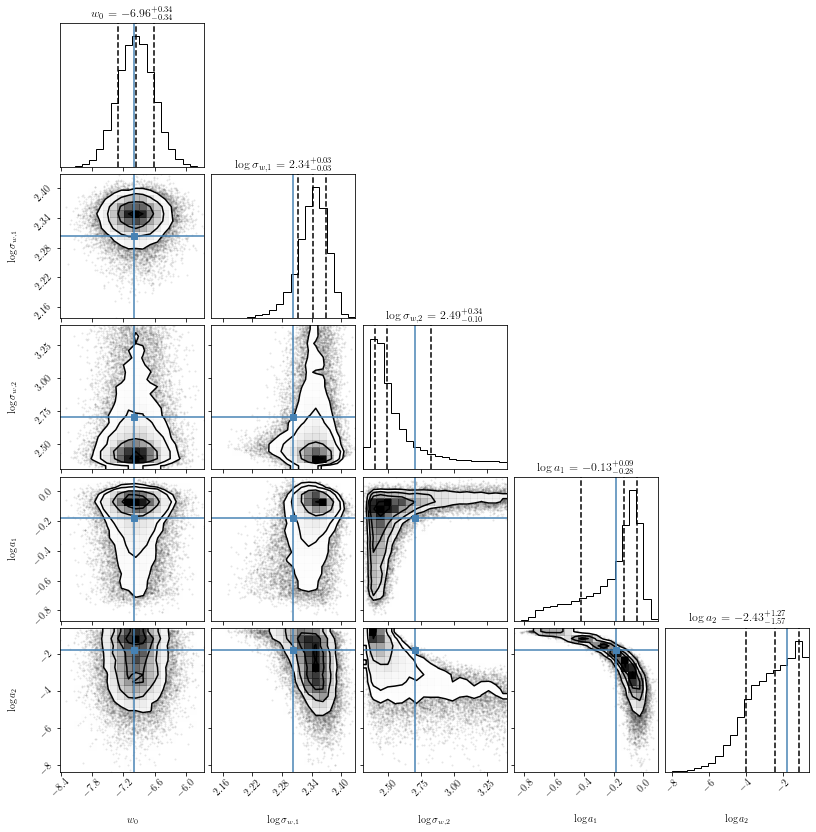

psi_721.npy


100%|██████████| 5000/5000 [00:00<00:00, 44276.13it/s]


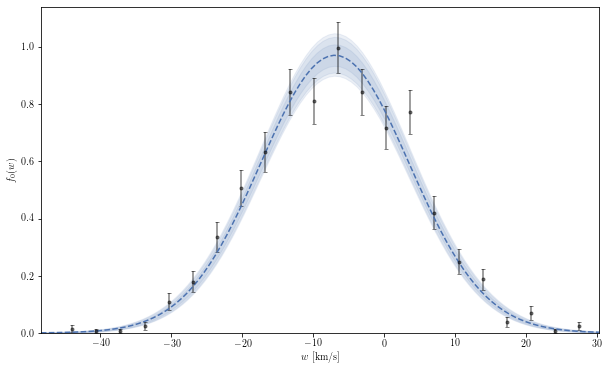

1.152 MB
(24000, 6)
Done with  psi_721.npy


In [8]:
files = glob(join(w_dir_path, "w*"))
files.sort()
for ind, file in enumerate(files):
    wdata = get_data(w_dir_path, ind, tipe="w")
    name = file.split("/")[-1].split(".")[0].replace("w", "psi") + ".npy"
    print("Starting ", name)
    # load data
    wmid, wnum, werr = wdata
    plt.errorbar(wmid, wnum, yerr=werr, fmt='.')
    plt.xlabel("Vertical Velocity [km/s]")
    plt.ylabel("Number of Stars")
    plt.show()
    # generate initial position
    _, locs, scales, labels, labs = generate_init("kin")
    ndim = len(labs)
    nwalker = 10*ndim
    p0 = None
    while True:
        p0 = vel.generate_p0(nwalker, locs, scales)
        indexes = list(range(ndim))
        prob0 = vel.log_prob_par(p0, wdata, locs, scales)
        mask = np.isinf(prob0[:, 0])
        p0 = p0[~mask]
        if p0.shape[0] % 2 != 0:
            p0 = np.append(p0, p0[0][None, :], axis=0)
        p0.shape
        if len(p0) > 2*ndim:
            break
    # run mcmc
    for _ in tqdm(range(5)):
        chain = vel.mcmc(5000, p0, wdata, locs, scales,
                         parallel=True, verbose=True)
        locs_normal, scales_normal = get_initial_position_normal(
            "kin", chain=chain[1000:], indexes=indexes)
        while True:
            p0 = vel.generate_p0(nwalker, locs_normal, scales_normal)
            indexes = list(range(ndim))
            prob0 = vel.log_prob_par(p0, wdata, locs, scales)
            mask = np.isinf(prob0[:, 0])
            p0 = p0[~mask]
            if p0.shape[0] % 2 != 0:
                p0 = np.append(p0, p0[0][None, :], axis=0)
            p0.shape
            if len(p0) > 2*ndim:
                break
        chain = vel.mcmc(5000, p0, wdata, locs, scales,
                         parallel=True, verbose=True)
        p0 = chain[-1]
    chain = vel.mcmc(100_000, p0, wdata, locs, scales,
                     parallel=True, verbose=True)
    chain_thin = chain[::250]
    # plot chain
    params = get_params(chain_thin, indexes, labs)
    print(name)
    plot_chain().params(params).labels(labels).alpha(0.01).run()
    # plot corner
    print(name)
    plot_corner().params(params[:, :, :-1]
                         ).labels(labels[:-1]).truths(psi).run()
    # plot fit
    print(name)
    flat_samples = chain_thin.reshape(-1, ndim)
    plot_fit_w().index(ind).w_dir_path(w_dir_path).flat(flat_samples).run()
    # save chain
    print(flat_samples.nbytes/1e6, "MB")
    print(flat_samples.shape)
    np.save(join(w_dir_path, 'PSI', name), flat_samples[:, :-1])
    print("Done with ", name)

## $N$

In [9]:
w_dir_path = join(root_data_dir, 'MCMC-no', 'mock', 'data', 'n')
z_dir_path = join(root_data_dir, 'MCMC-no', 'mock', 'data', 'n')
w_dir_path, z_dir_path

('/home2/s20321005/Thesis-Project/Data/MCMC-no/mock/data/n',
 '/home2/s20321005/Thesis-Project/Data/MCMC-no/mock/data/n')

Starting  psi_00500.npy


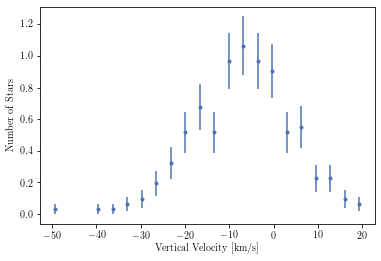

  0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 5/5 [00:04<00:00,  1.14it/s]


psi_00500.npy


6it [00:00, 19.03it/s]


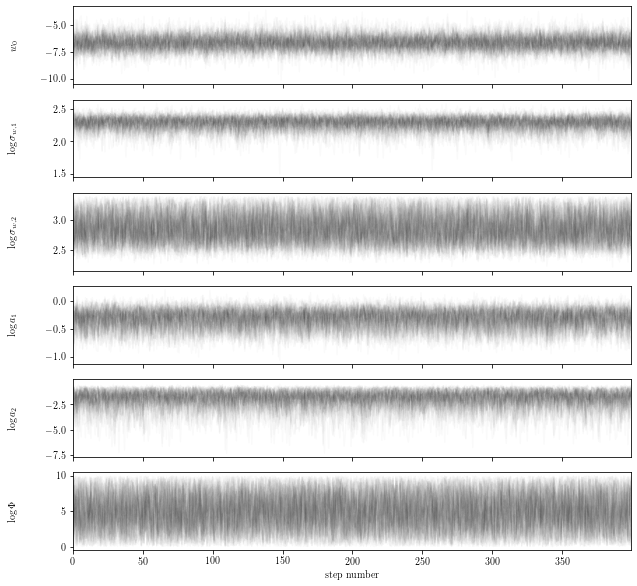

psi_00500.npy


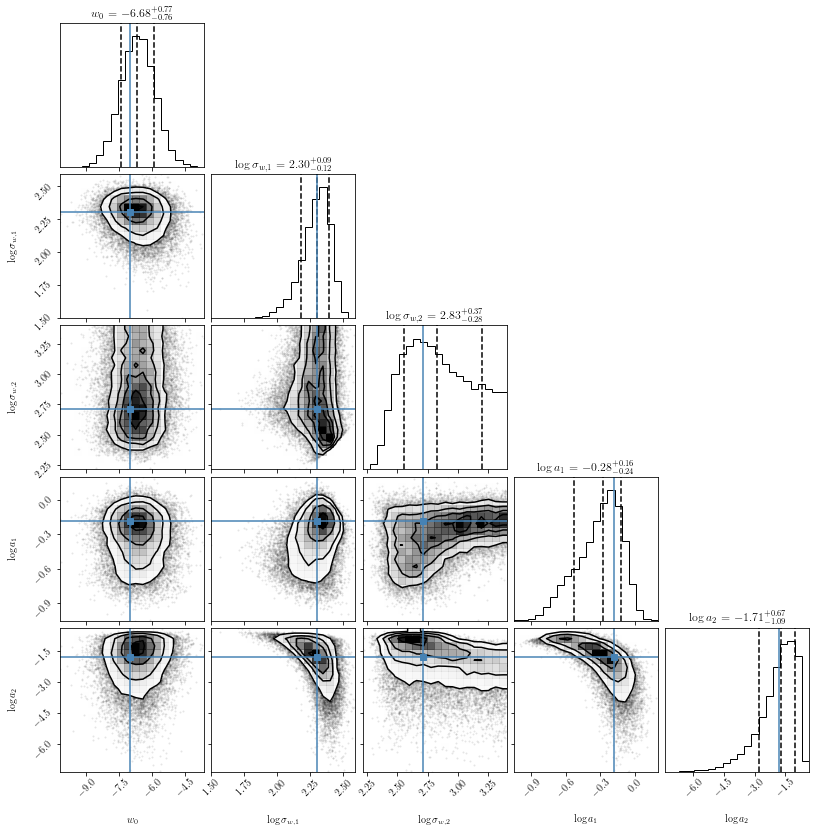

psi_00500.npy


100%|██████████| 5000/5000 [00:00<00:00, 40613.67it/s]


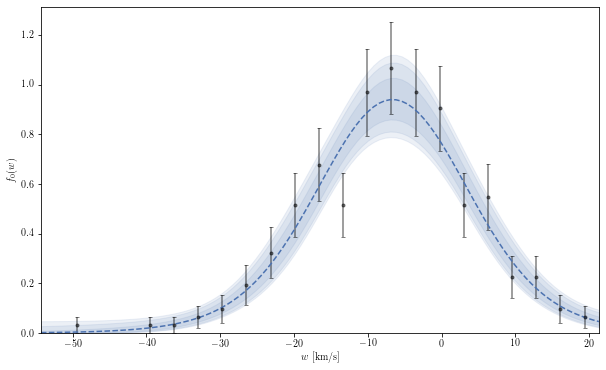

1.152 MB
(24000, 6)
Done with  psi_00500.npy
Starting  psi_01000.npy


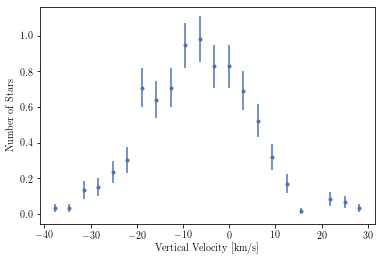

100%|██████████| 5/5 [00:04<00:00,  1.16it/s]


psi_01000.npy


6it [00:00, 17.69it/s]


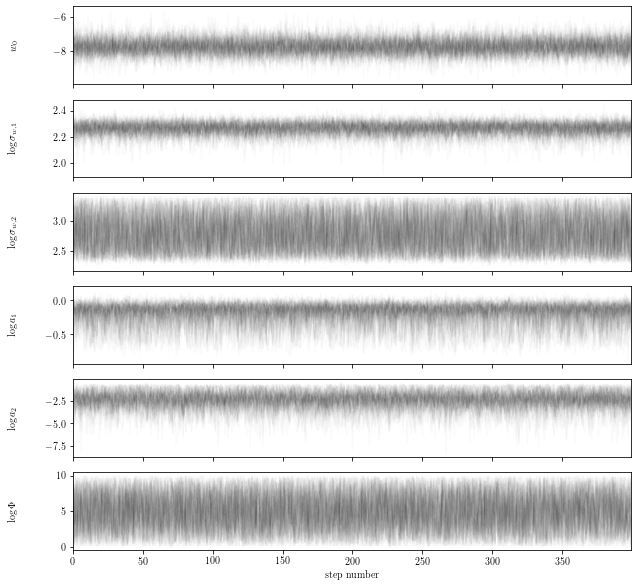

psi_01000.npy


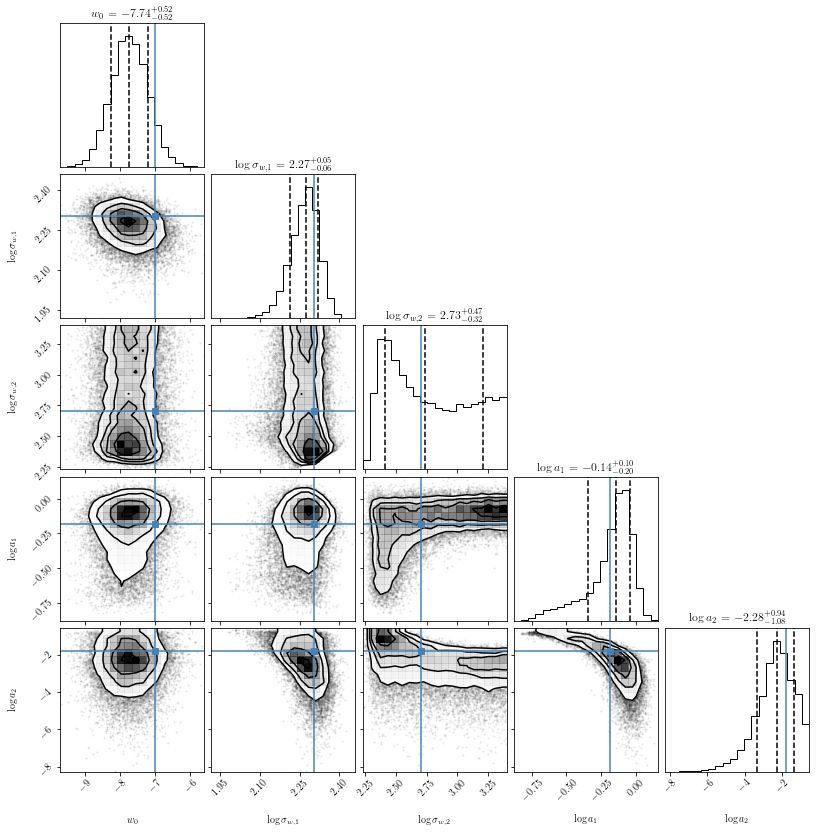

psi_01000.npy


100%|██████████| 5000/5000 [00:00<00:00, 38694.41it/s]


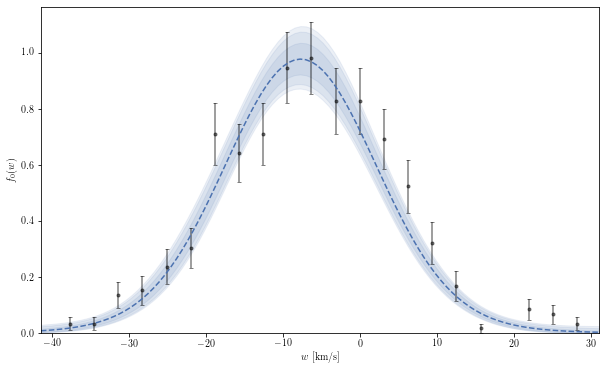

1.152 MB
(24000, 6)
Done with  psi_01000.npy
Starting  psi_01500.npy


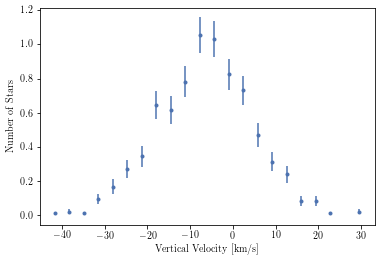

100%|██████████| 5/5 [00:04<00:00,  1.10it/s]


psi_01500.npy


6it [00:00, 49.60it/s]


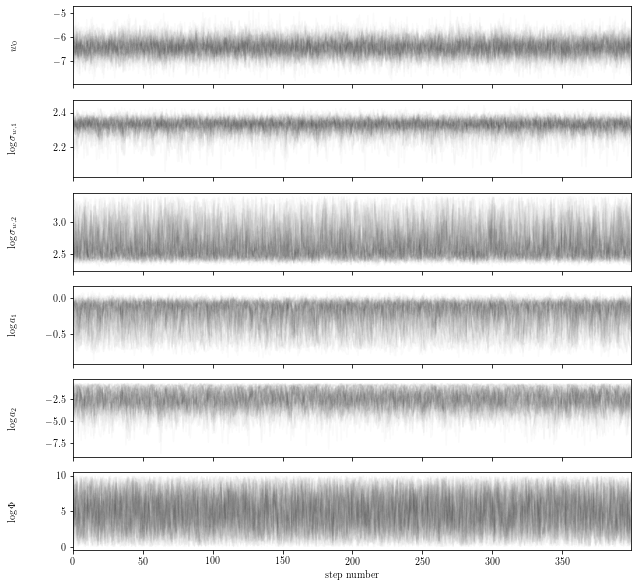

psi_01500.npy


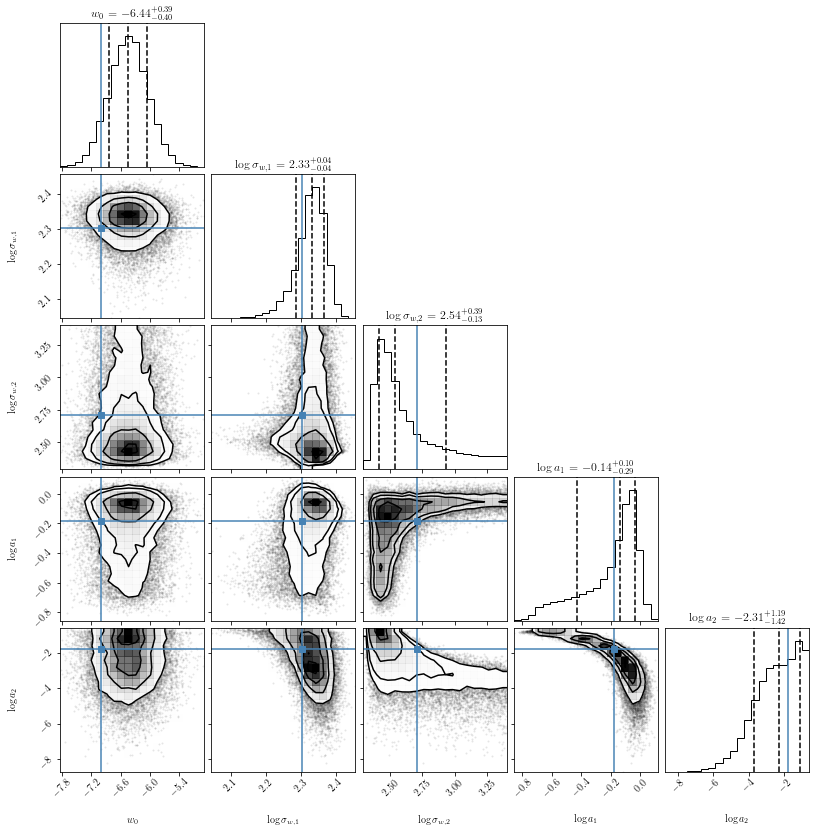

psi_01500.npy


100%|██████████| 5000/5000 [00:00<00:00, 40095.60it/s]


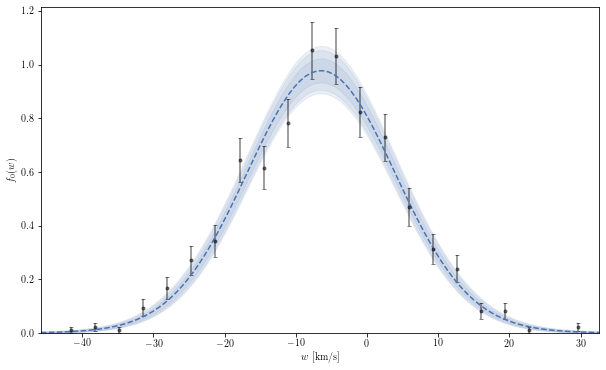

1.152 MB
(24000, 6)
Done with  psi_01500.npy
Starting  psi_02000.npy


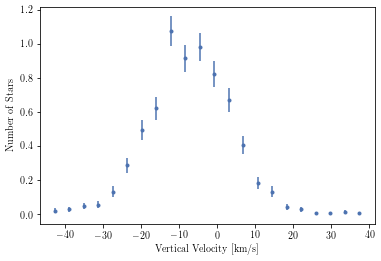

100%|██████████| 5/5 [00:04<00:00,  1.14it/s]


psi_02000.npy


6it [00:00, 47.31it/s]


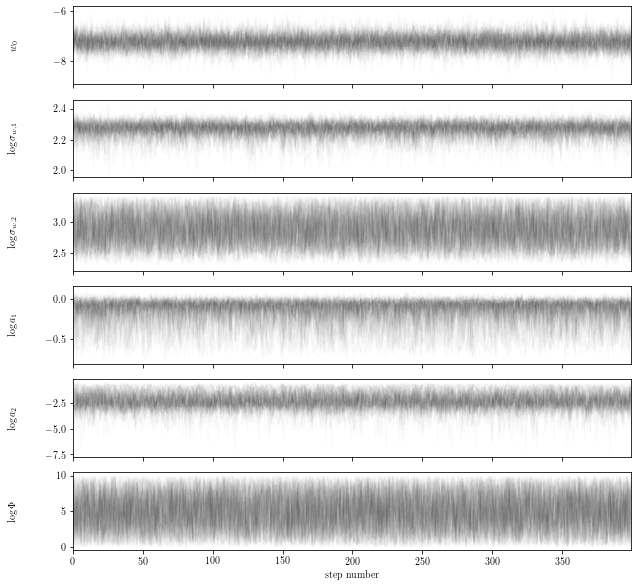

psi_02000.npy


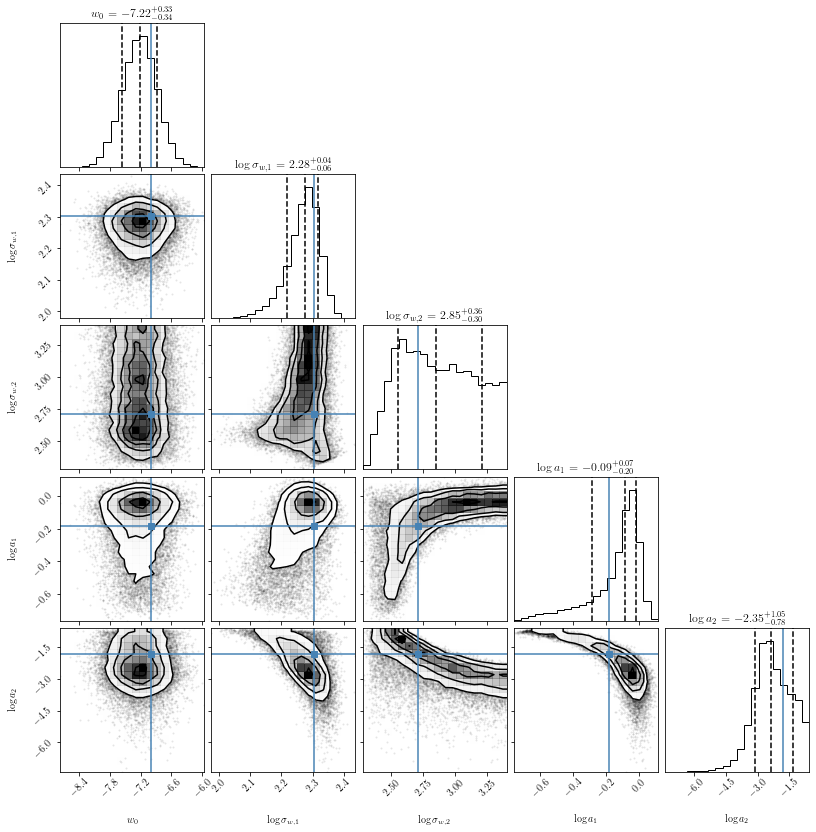

psi_02000.npy


100%|██████████| 5000/5000 [00:00<00:00, 41678.96it/s]


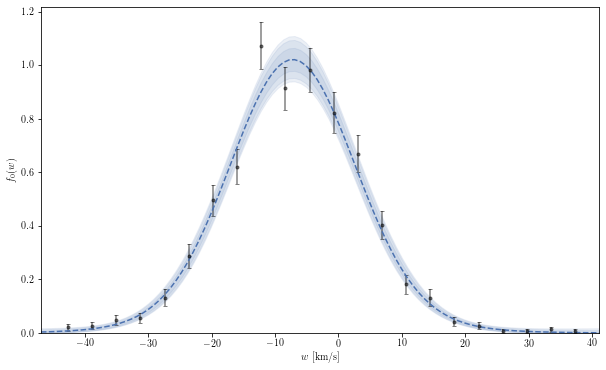

1.152 MB
(24000, 6)
Done with  psi_02000.npy
Starting  psi_05000.npy


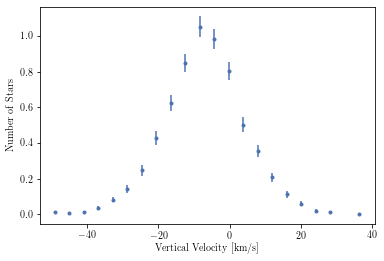

100%|██████████| 5/5 [00:04<00:00,  1.16it/s]


psi_05000.npy


6it [00:00, 47.08it/s]


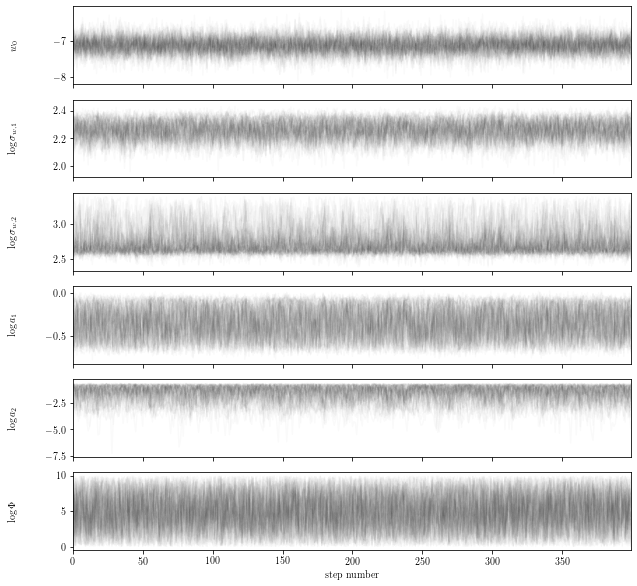

psi_05000.npy


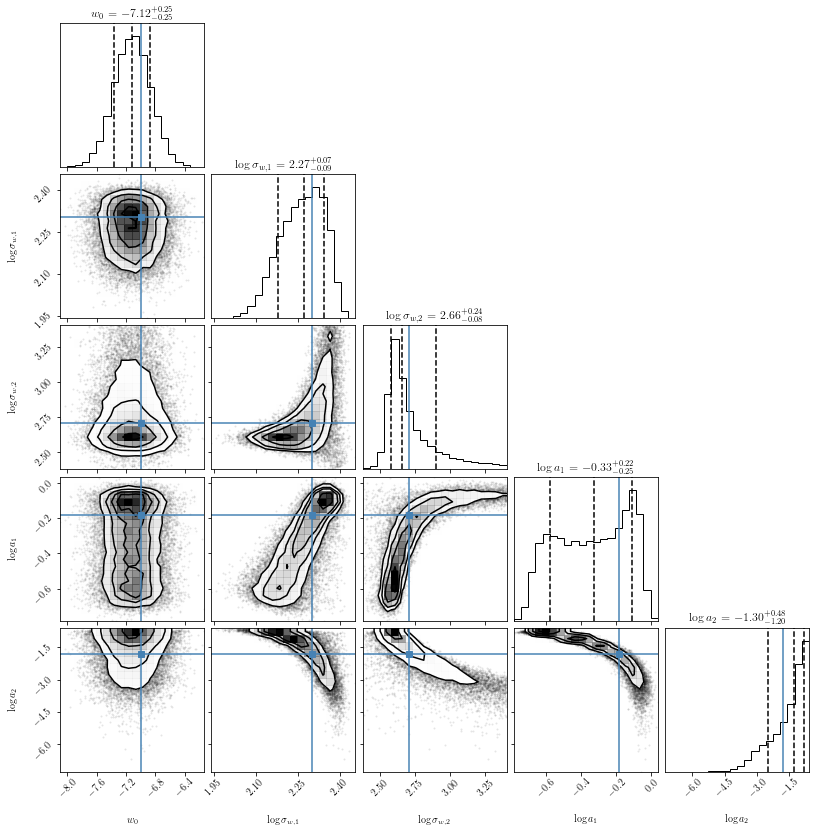

psi_05000.npy


100%|██████████| 5000/5000 [00:00<00:00, 39995.27it/s]


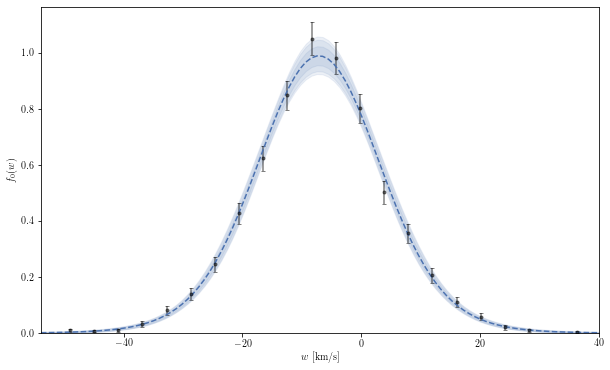

1.152 MB
(24000, 6)
Done with  psi_05000.npy
Starting  psi_10000.npy


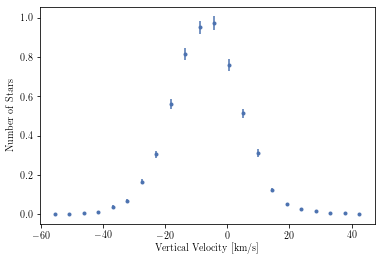

100%|██████████| 5/5 [00:04<00:00,  1.14it/s]


psi_10000.npy


6it [00:00, 44.76it/s]


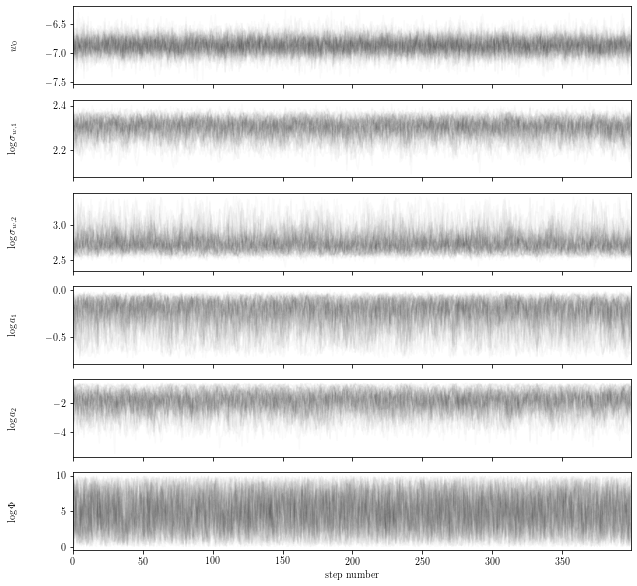

psi_10000.npy


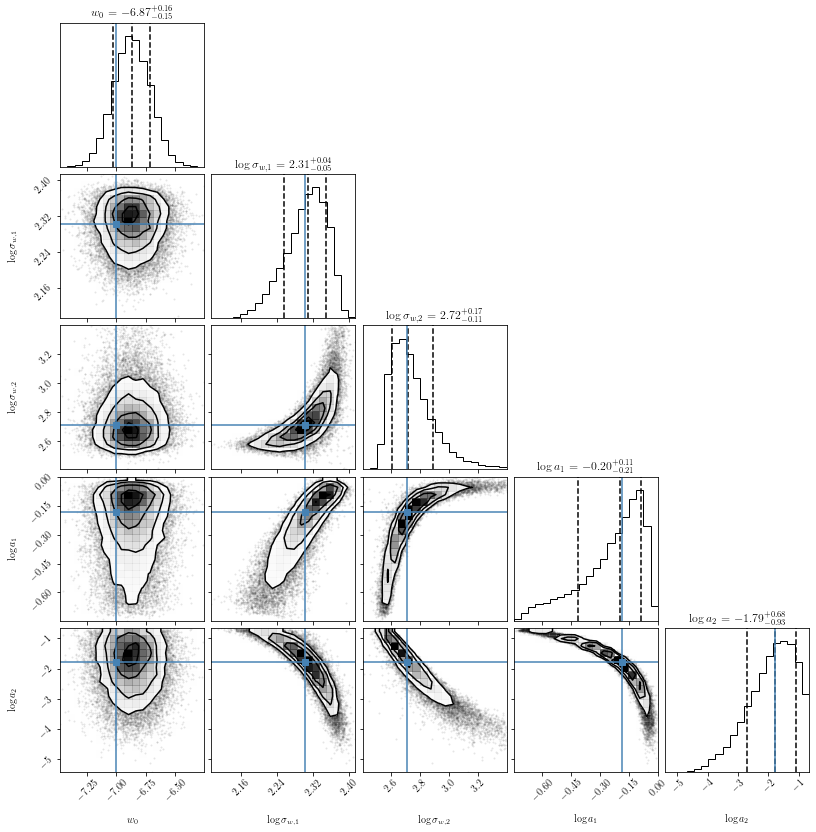

psi_10000.npy


100%|██████████| 5000/5000 [00:00<00:00, 34554.86it/s]


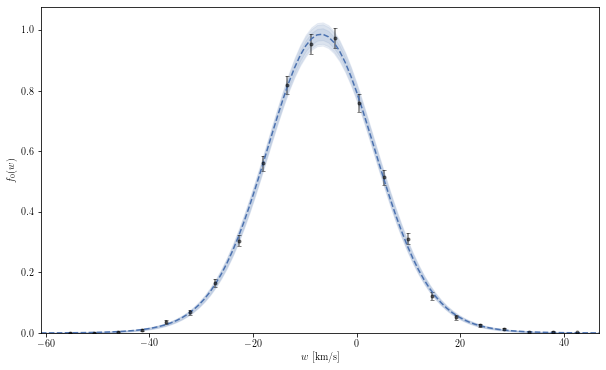

1.152 MB
(24000, 6)
Done with  psi_10000.npy


In [10]:
files = glob(join(w_dir_path, "w*"))
files.sort()
for ind, file in enumerate(files):
    wdata = get_data(w_dir_path, ind, tipe="w")
    name = file.split("/")[-1].split(".")[0].replace("w", "psi") + ".npy"
    print("Starting ", name)
    # load data
    wmid, wnum, werr = wdata
    plt.errorbar(wmid, wnum, yerr=werr, fmt='.')
    plt.xlabel("Vertical Velocity [km/s]")
    plt.ylabel("Number of Stars")
    plt.show()
    # generate initial position
    _, locs, scales, labels, labs = generate_init("kin")
    ndim = len(labs)
    nwalker = 10*ndim
    p0 = None
    while True:
        p0 = vel.generate_p0(nwalker, locs, scales)
        indexes = list(range(ndim))
        prob0 = vel.log_prob_par(p0, wdata, locs, scales)
        mask = np.isinf(prob0[:, 0])
        p0 = p0[~mask]
        if p0.shape[0] % 2 != 0:
            p0 = np.append(p0, p0[0][None, :], axis=0)
        p0.shape
        if len(p0) > 2*ndim:
            break
    # run mcmc
    for _ in tqdm(range(5)):
        chain = vel.mcmc(5000, p0, wdata, locs, scales,
                         parallel=True, verbose=True)
        locs_normal, scales_normal = get_initial_position_normal(
            "kin", chain=chain[1000:], indexes=indexes)
        while True:
            p0 = vel.generate_p0(nwalker, locs_normal, scales_normal)
            indexes = list(range(ndim))
            prob0 = vel.log_prob_par(p0, wdata, locs, scales)
            mask = np.isinf(prob0[:, 0])
            p0 = p0[~mask]
            if p0.shape[0] % 2 != 0:
                p0 = np.append(p0, p0[0][None, :], axis=0)
            p0.shape
            if len(p0) > 2*ndim:
                break
        chain = vel.mcmc(5000, p0, wdata, locs, scales,
                         parallel=True, verbose=True)
        p0 = chain[-1]
    chain = vel.mcmc(100_000, p0, wdata, locs, scales,
                     parallel=True, verbose=True)
    chain_thin = chain[::250]
    # plot chain
    params = get_params(chain_thin, indexes, labs)
    print(name)
    plot_chain().params(params).labels(labels).alpha(0.02).run()
    # plot corner
    print(name)
    plot_corner().params(params[:, :, :-1]
                         ).labels(labels[:-1]).truths(psi).run()
    # plot fit
    print(name)
    flat_samples = chain_thin.reshape(-1, ndim)
    plot_fit_w().index(ind).w_dir_path(w_dir_path).flat(flat_samples).run()
    # save chain
    print(flat_samples.nbytes/1e6, "MB")
    print(flat_samples.shape)
    np.save(join(w_dir_path, 'PSI', name), flat_samples[:, :-1])
    print("Done with ", name)

# Comp

In [3]:
w_dir_path = join(root_data_dir, 'MCMC-no', 'mock', 'data', 'mock')
z_dir_path = join(root_data_dir, 'MCMC-no', 'mock', 'data', 'mock')
w_dir_path, z_dir_path

('/home2/s20321005/Thesis-Project/Data/MCMC-no/mock/data/mock',
 '/home2/s20321005/Thesis-Project/Data/MCMC-no/mock/data/mock')

Starting  psi_0001000.npy


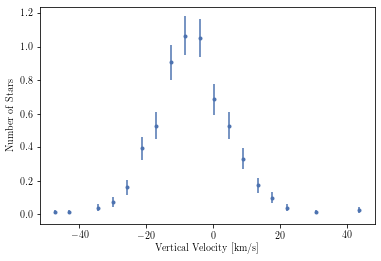

 20%|██        | 1/5 [00:02<00:08,  2.11s/it]

100%|██████████| 5/5 [00:14<00:00,  2.92s/it]


psi_0001000.npy


6it [00:00, 14.91it/s]


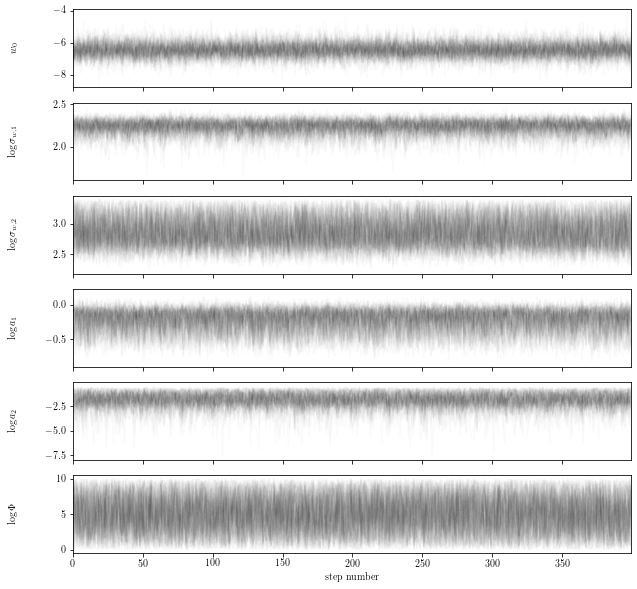

psi_0001000.npy


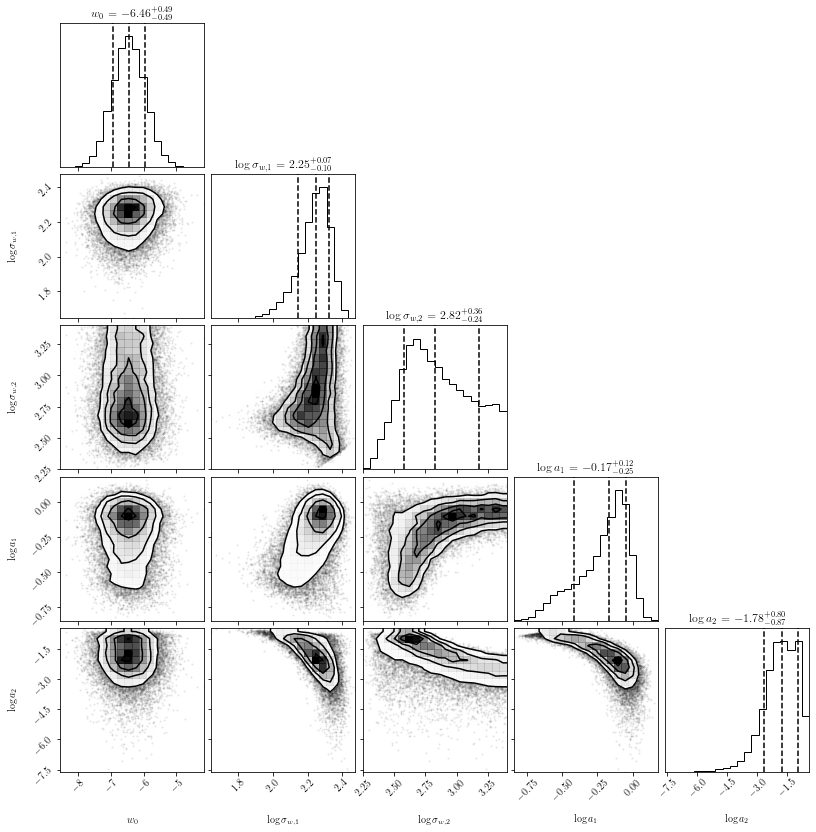

psi_0001000.npy


100%|██████████| 5000/5000 [00:00<00:00, 24620.53it/s]


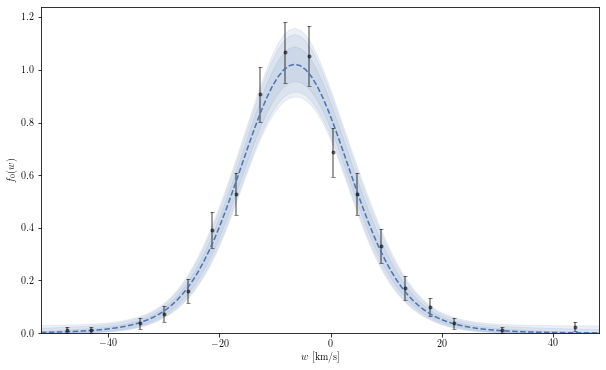

1.152 MB
(24000, 6)
Done with  psi_0001000.npy
Starting  psi_0005000.npy


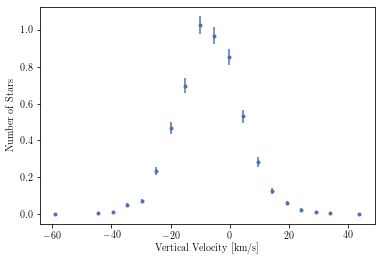

100%|██████████| 5/5 [00:15<00:00,  3.14s/it]


psi_0005000.npy


6it [00:00, 28.55it/s]


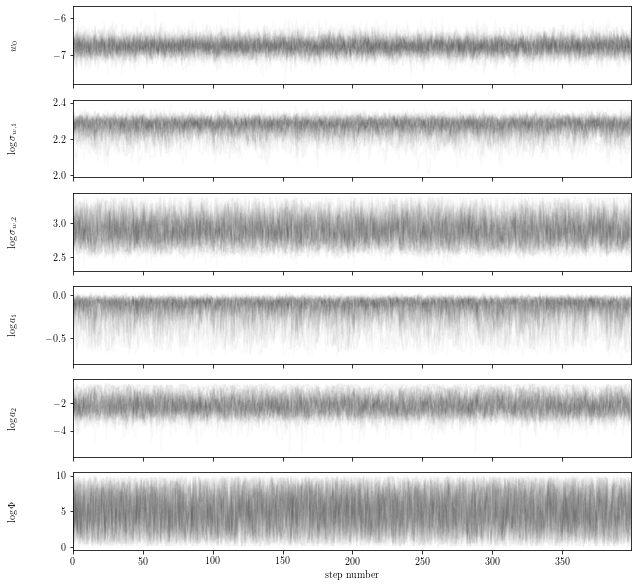

psi_0005000.npy


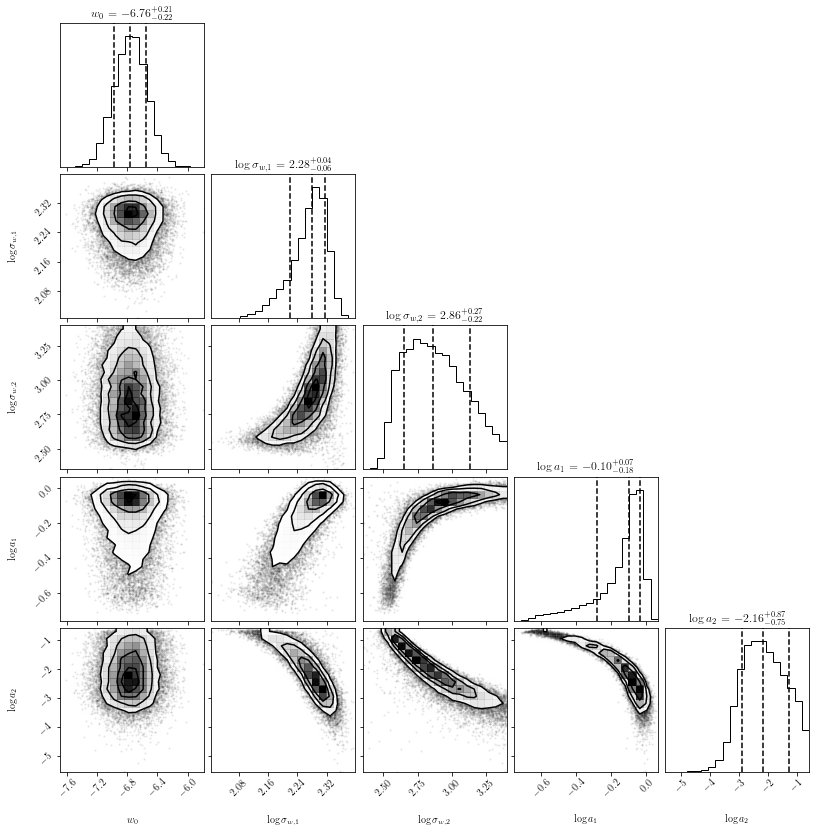

psi_0005000.npy


100%|██████████| 5000/5000 [00:00<00:00, 24750.59it/s]


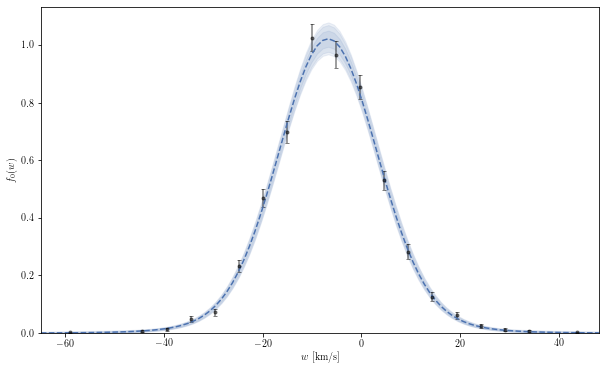

1.152 MB
(24000, 6)
Done with  psi_0005000.npy
Starting  psi_0010000.npy


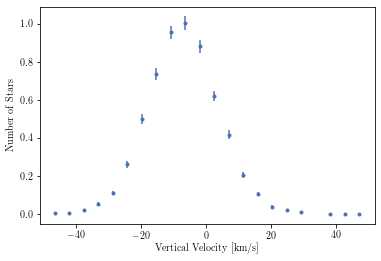

100%|██████████| 5/5 [00:16<00:00,  3.23s/it]


psi_0010000.npy


6it [00:00, 25.09it/s]


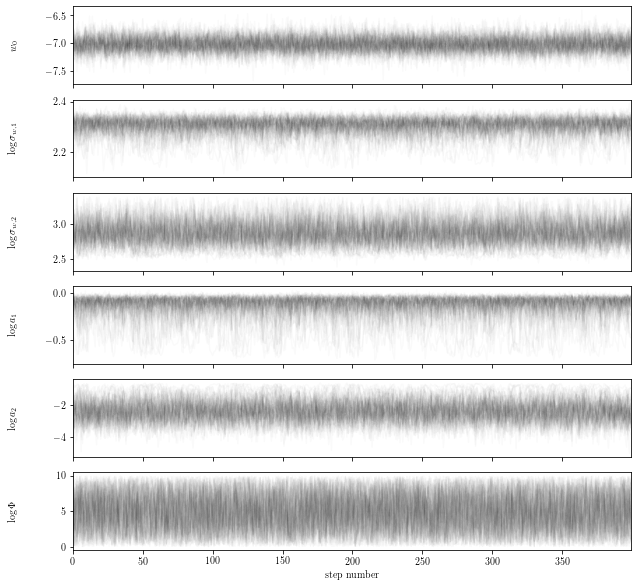

psi_0010000.npy


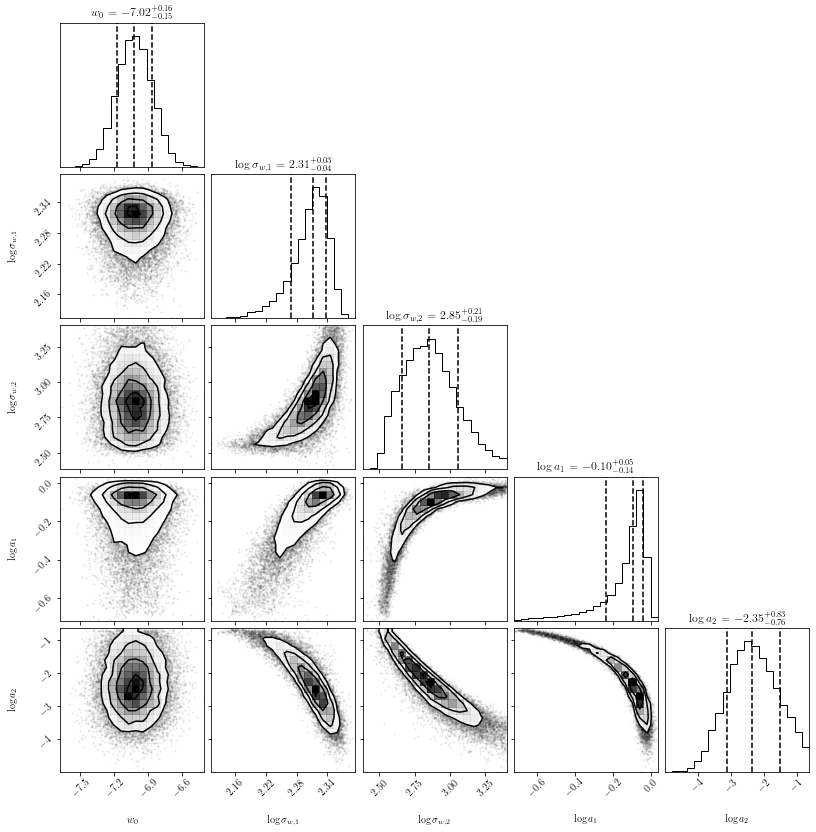

psi_0010000.npy


100%|██████████| 5000/5000 [00:00<00:00, 24694.22it/s]


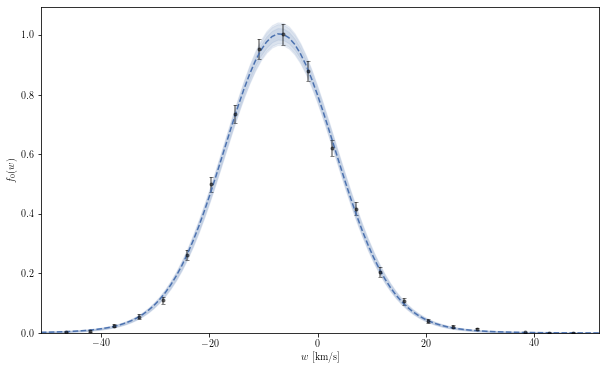

1.152 MB
(24000, 6)
Done with  psi_0010000.npy
Starting  psi_0050000.npy


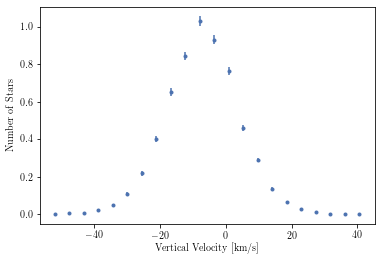

100%|██████████| 5/5 [00:15<00:00,  3.13s/it]


psi_0050000.npy


6it [00:00, 28.39it/s]


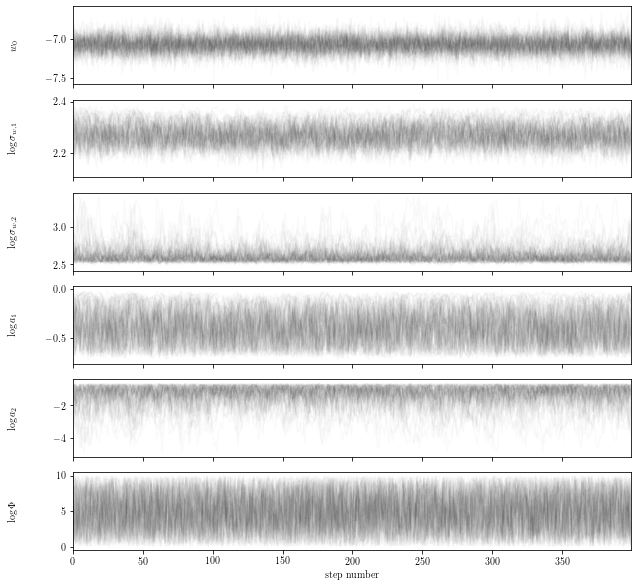

psi_0050000.npy


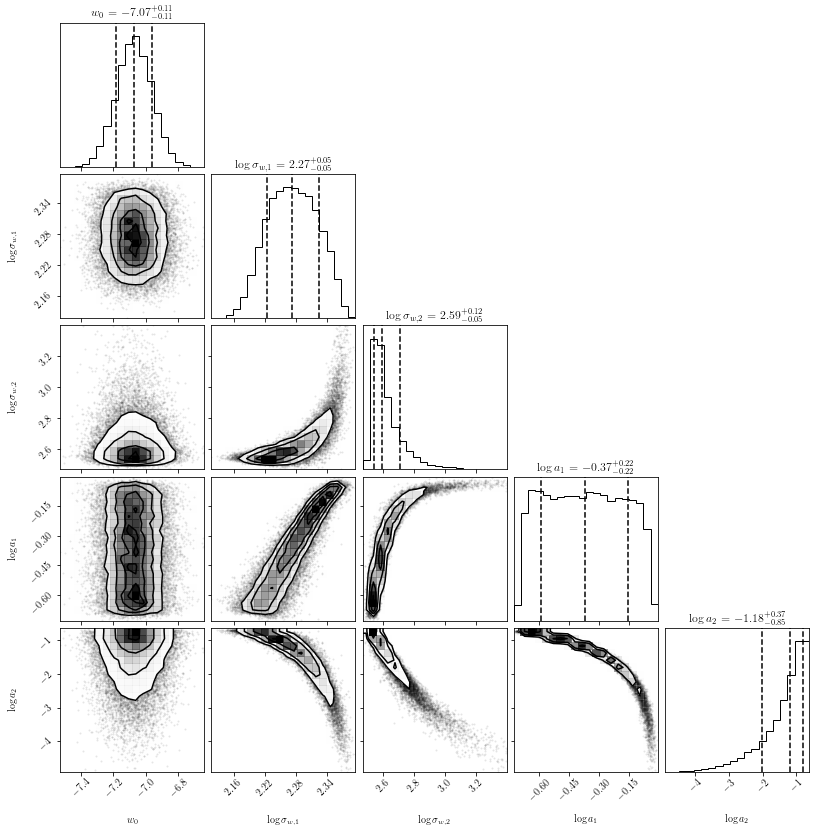

psi_0050000.npy


100%|██████████| 5000/5000 [00:00<00:00, 18033.42it/s]


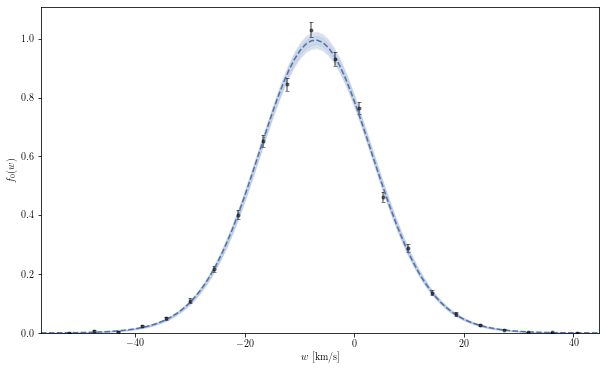

1.152 MB
(24000, 6)
Done with  psi_0050000.npy
Starting  psi_0100000.npy


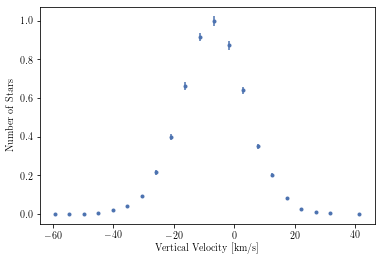

100%|██████████| 5/5 [00:16<00:00,  3.23s/it]


psi_0100000.npy


6it [00:00, 27.08it/s]


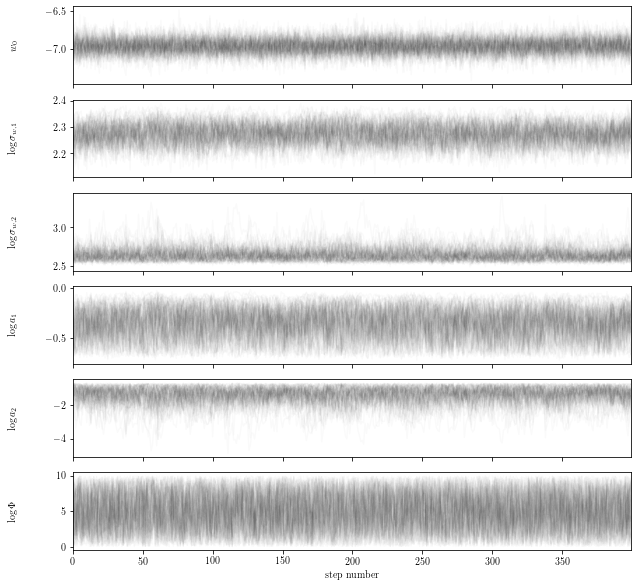

psi_0100000.npy


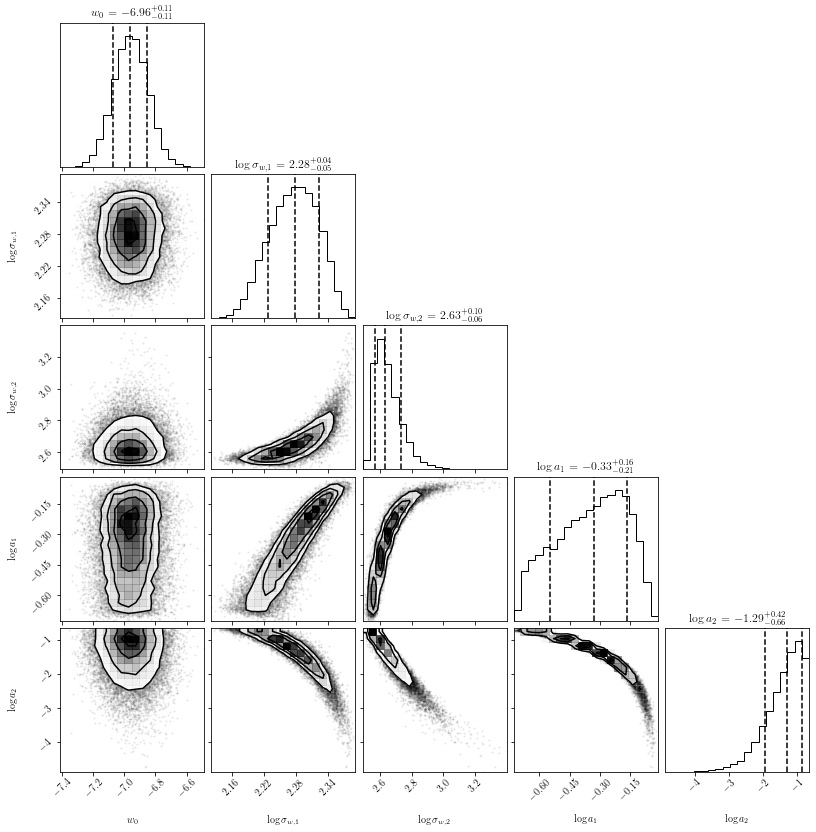

psi_0100000.npy


100%|██████████| 5000/5000 [00:00<00:00, 20530.93it/s]


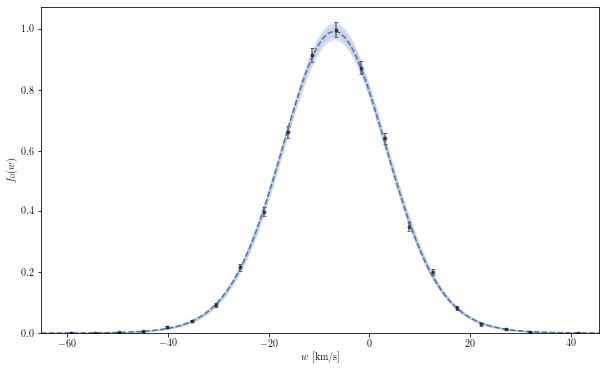

1.152 MB
(24000, 6)
Done with  psi_0100000.npy
Starting  psi_0500000.npy


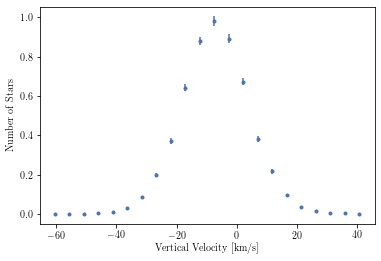

100%|██████████| 5/5 [00:15<00:00,  3.14s/it]


psi_0500000.npy


6it [00:00, 15.03it/s]


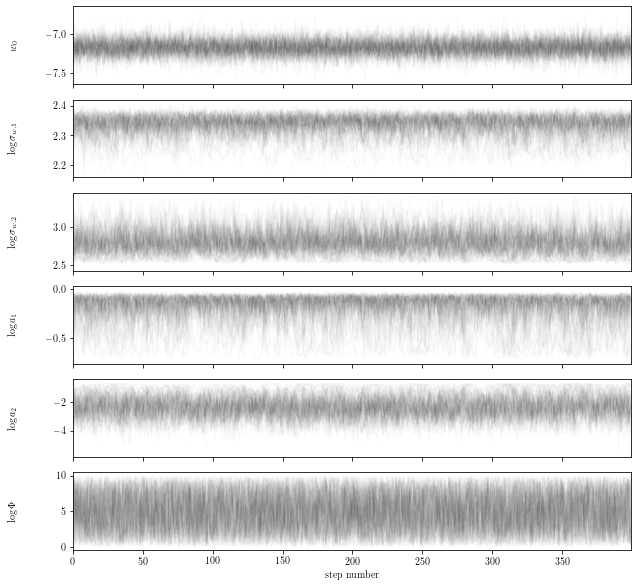

psi_0500000.npy


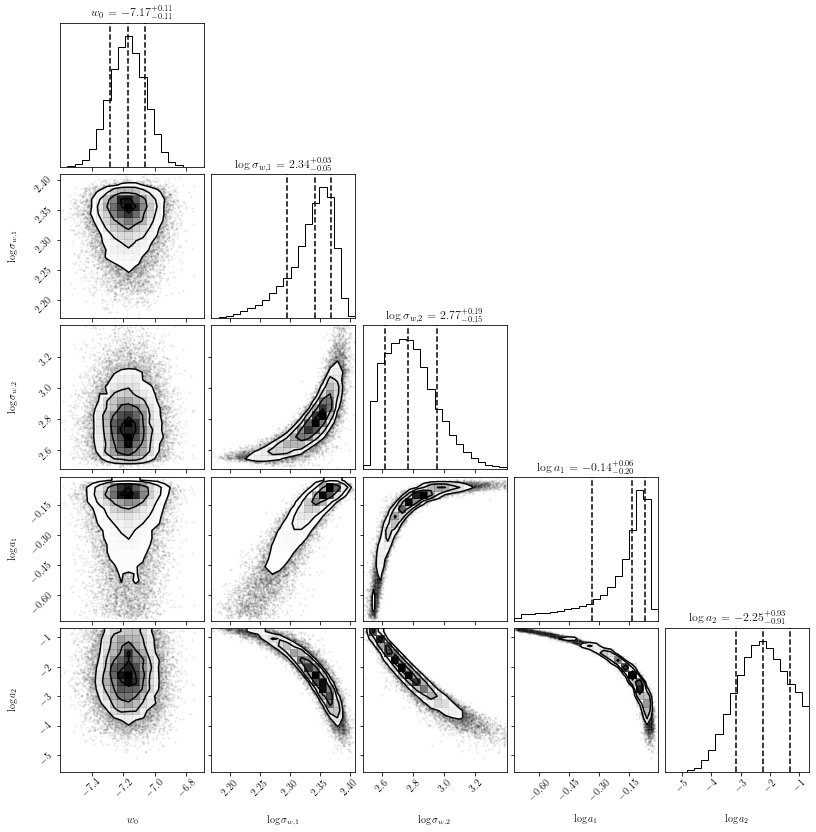

psi_0500000.npy


100%|██████████| 5000/5000 [00:00<00:00, 24546.18it/s]


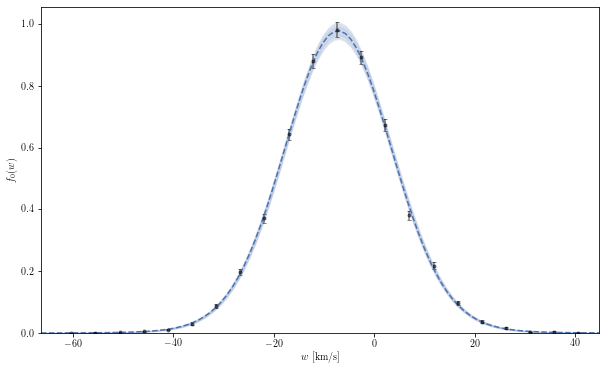

1.152 MB
(24000, 6)
Done with  psi_0500000.npy
Starting  psi_1000000.npy


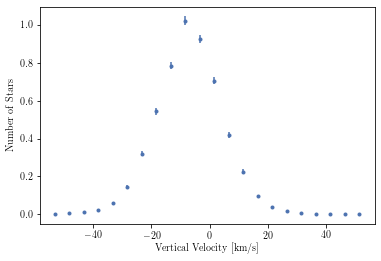

100%|██████████| 5/5 [00:16<00:00,  3.22s/it]


psi_1000000.npy


6it [00:00, 29.09it/s]


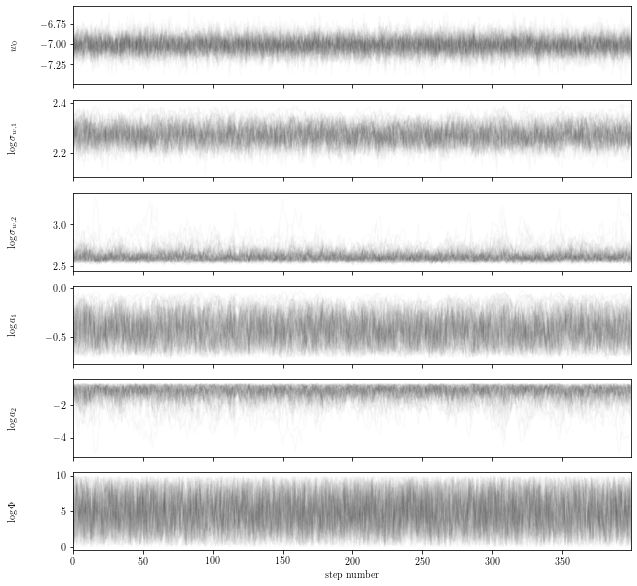

psi_1000000.npy


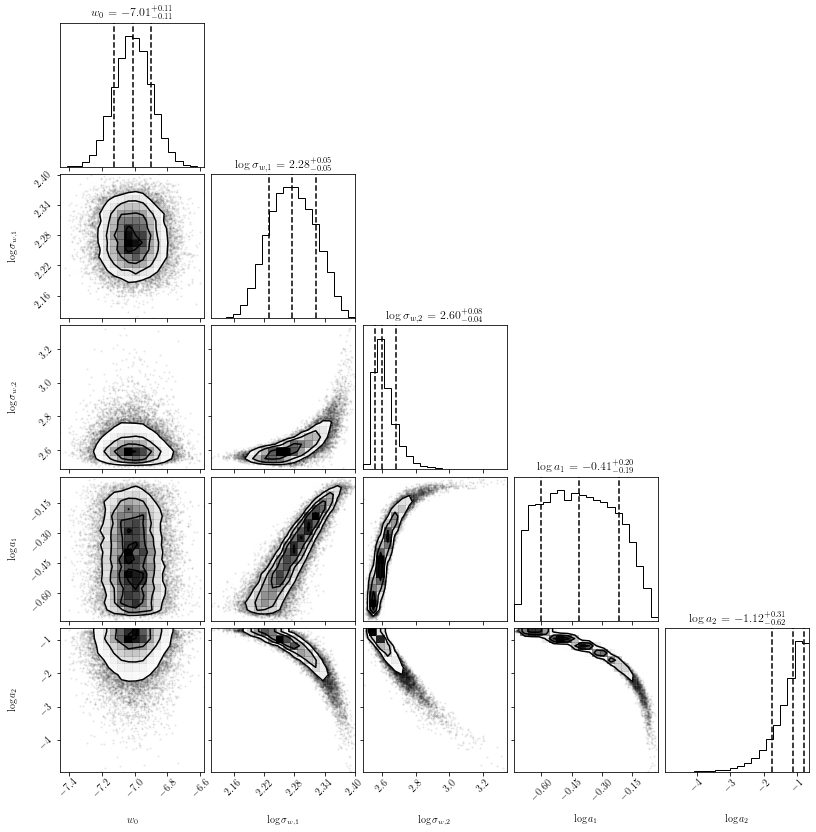

psi_1000000.npy


100%|██████████| 5000/5000 [00:00<00:00, 24506.68it/s]


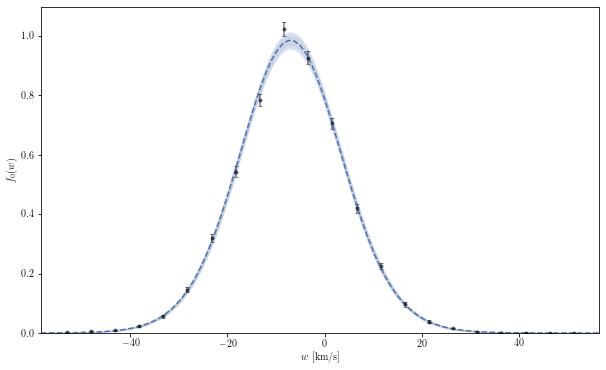

1.152 MB
(24000, 6)
Done with  psi_1000000.npy


In [7]:
files = glob(join(w_dir_path, "w*"))
files.sort()
for ind, file in enumerate(files):
    wdata = get_data(w_dir_path, ind, tipe="w")
    name = file.split("/")[-1].split(".")[0].replace("w", "psi") + ".npy"
    print("Starting ", name)
    # load data
    wmid, wnum, werr = wdata
    plt.errorbar(wmid, wnum, yerr=werr, fmt='.')
    plt.xlabel("Vertical Velocity [km/s]")
    plt.ylabel("Number of Stars")
    plt.show()
    # continue
    # generate initial position
    _, locs, scales, labels, labs = generate_init("kin")
    ndim = len(labs)
    nwalker = 10*ndim
    p0 = None
    while True:
        p0 = vel.generate_p0(nwalker, locs, scales)
        indexes = list(range(ndim))
        prob0 = vel.log_prob_par(p0, wdata, locs, scales)
        mask = np.isinf(prob0[:, 0])
        p0 = p0[~mask]
        if p0.shape[0] % 2 != 0:
            p0 = np.append(p0, p0[0][None, :], axis=0)
        p0.shape
        if len(p0) > 2*ndim:
            break
    # run mcmc
    for _ in tqdm(range(5)):
        chain = vel.mcmc(5000, p0, wdata, locs, scales,
                         parallel=True, verbose=True)
        locs_normal, scales_normal = get_initial_position_normal(
            "kin", chain=chain[1000:], indexes=indexes)
        while True:
            p0 = vel.generate_p0(nwalker, locs_normal, scales_normal)
            indexes = list(range(ndim))
            prob0 = vel.log_prob_par(p0, wdata, locs, scales)
            mask = np.isinf(prob0[:, 0])
            p0 = p0[~mask]
            if p0.shape[0] % 2 != 0:
                p0 = np.append(p0, p0[0][None, :], axis=0)
            p0.shape
            if len(p0) > 2*ndim:
                break
        chain = vel.mcmc(5000, p0, wdata, locs, scales,
                         parallel=True, verbose=True)
        p0 = chain[-1]
    chain = vel.mcmc(100_000, p0, wdata, locs, scales,
                     parallel=True, verbose=True)
    chain_thin = chain[::250]
    # plot chain
    params = get_params(chain_thin, indexes, labs)
    print(name)
    plot_chain().params(params).labels(labels).alpha(0.02).run()
    # plot corner
    print(name)
    plot_corner().params(params[:, :, :-1]
                         ).labels(labels[:-1]).run()
    # plot fit
    print(name)
    flat_samples = chain_thin.reshape(-1, ndim)
    plot_fit_w().index(ind).w_dir_path(w_dir_path).flat(flat_samples).run()
    # save chain
    print(flat_samples.nbytes/1e6, "MB")
    print(flat_samples.shape)
    np.save(join(w_dir_path, name), flat_samples[:, :-1])
    print("Done with ", name)